### Universidad Santo Tomás

#### Visualización ciencia de datos en python

##### Entrega Segunda Proyecto

###### Participantes:

__Juan David Sarmiento Paramo__

__María Alejandra Bolivar Cardenas__

__Gabriela Cortés Merchán__
  

El proyecto consta de los Datos abiertos de  justicia y derecho conteos de procesos, adicionalmente podemos encontrar la tabla de contenido, del significado de cada variable

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
import matplotlib.pyplot as plt
import altair as alt
from vega_datasets import data
from matplotlib import cm
from math import log10
import matplotlib.ticker as mtick
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
px.set_mapbox_access_token("pk.eyJ1IjoianVhbmRzYXJtaWVudG8tcGFyYW1vIiwiYSI6ImNrbm0yNzlyczBkanIyd285dDhmd3ZpZ3kifQ.Pp22Yn1Qo5AL2xFTFipi-Q")


pd.set_option('display.max_columns', None) #Mostrar todas las columnas
sns.set(rc={'figure.figsize':(15,9)})

La base arreglada, cuenta con $2047396$  filas y 21 columnas en las cuales podemos mostrar que aún tenemos una base en la cual se puede explicar mucho.

In [2]:
CONTEO_DE_PROCESOS = pd.read_csv('C:/Users/Gabriela C/Downloads/CONTEO_DE_PROCESOS (1).csv')
CONTEO_DE_PROCESOS.head()

,Unnamed: 0,HECHO,RUPTURA,CONEXO,ESTADO_NOTICIA,ETAPA,ANIO_DENUNCIA,ANIO_ENTRADA,ANIO_HECHO,LEY,PAIS,DEPARTAMENTO,MUNICIPIO,SECCIONAL,GRUPO_DELITO,DELITO,CAPTURA,IMPUTACION,CONDENA,ACUSACION,HOMICIDIO_DOLOSO_CONSUMADO,TOTAL_PROCESOS
0,0,SI,NO,NO,ACTIVO,INDAGACIÓN,2017,2017,2016,Ley 906,Colombia,Cundinamarca,FACATATIVÁ,DIRECCIÓN SECCIONAL DE CUNDINAMARCA,FALSEDAD EN DOCUMENTO,FALSEDAD IDEOLOGICA EN DOCUMENTO PUBLICO. ART....,NO,NO,NO,NO,NO,1
1,1,SI,NO,NO,ACTIVO,INDAGACIÓN,2020,2020,2020,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,HURTO,HURTO. ART. 239 C.P. AGRAVADO CUANDO LO HURTAD...,NO,NO,NO,NO,NO,891
2,2,SI,NO,NO,ACTIVO,JUICIO,2020,2020,2020,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,HURTO,HURTO CALIFICADO MENOR CUANTIA ART. 240 C.P. ...,NO,SI,NO,NO,NO,284
3,3,SI,NO,NO,INACTIVO,EJECUCIÓN DE PENAS,2017,2017,2017,Ley 906,Colombia,Huila,LA PLATA,DIRECCION ESPECIALIZADA CONTRA ORGANIZACIONES ...,ESTUPEFACIENTES,TRAFICO FABRICACION O PORTE DE ESTUPEFACIENTES...,SI,SI,SI,SI,NO,1
4,4,SI,NO,NO,INACTIVO,INDAGACIÓN,2011,2011,2011,Ley 1098,Colombia,Antioquia,MEDELLÍN,DIRECCIÓN SECCIONAL DE MEDELLÍN,SEGURIDAD PUBLICA,OBSTRUCCION A VIAS PUBLICAS QUE AFECTAN EL ORD...,NO,NO,NO,NO,NO,1


### GABRIELA CORTÉS MERCHÁN

Antes de empezar con la realización de los modismos, la explicación y lo demás, se explicara el procesamiento que se le hizo a la base para realizar los modismos.


Primero  se realizó una basa en un Excel aparte, esta base  cuenta con 33 filas y 16 columnas en las cuales podemos encontrar una variable indicadora,  dos variables categóricas, las cuales corresponden a departamento y regiones, 2 atributos  de posición  en las cuales se encuentran las ubicaciones de los departamentos y regiones de Colombia y 11  atributos ordenado cuantitativo con dirección secuencial, el cual corresponde a las proyecciones poblacionales en distintos años.


Esta base fue propuesta gracias a los datos que el [DANE](https://www.dane.gov.co/index.php/estadisticas-por-tema/demografia-y-poblacion), nos brinda con sus proyecciones anuales por departamento,  estos datos fueron escogidos con el fin de poder realizar la tasa anual por departamento para el modismo Temporal, y otros años que más adelante se explicara por qué para los otros modismos en particular, el realizar las tasa tuvo como objetivo poder generar un análisis más a profundidad de lo que está pasando con los departamentos, para que su población  no afectara las interpretaciones. 



Adicionalmente las longitudes y latitudes se seleccionaron agracias a jpmarindiaz, en su página de [GITHUB]( https://github.com/datasketch/geodata/blob/master/inst/geodata/col/col-adm1-departments.csv), con el fin de utilizar esas posiciones para realizar el modismo espacial.


In [3]:
df_poblacion_pro = pd.read_excel('C:/Users/Gabriela C/Desktop/Semestre 8/Visualizacion en Phyton/Proyecto2/Proyeccion_poblacion.xlsx')
df_poblacion_pro.head()

,id,DEPARTAMENTO,REGIONES,LAT,LON,POBLACION_2010,POBLACION_2011,POBLACION_2012,POBLACION_2013,POBLACION_2014,POBLACION_2015,POBLACION_2016,POBLACION_2017,POBLACION_2018,POBLACION_2019,POBLACION_2020
0,91,Amazonas,Amazónia,-3.269956,-70.432942,72017,72858,73699,74541,75388,76243,77088,77948,78830,79739,80682
1,5,Antioquia,Andina,6.722434,-75.624600,6065846,6143709,6221742,6299886,6378069,6456207,6534764,6613063,6690977,6768362,6845057
2,81,Arauca,Orinoquía,6.744565,-71.501745,247541,250569,253565,256527,259447,262315,265190,267992,270708,273321,275814
3,88,"Archipiélago de San Andrés, Providencia y Sant...",Caribe,13.062639,-81.499283,73320,73925,74541,75167,75801,76442,77101,77759,78413,79060,79693
4,8,Atlántico,Caribe,10.691145,-74.983617,2314447,2344140,2373680,2403027,2432145,2461001,2489709,2518096,2546138,2573816,2601116


Al tener la base ya importada, se procedió a filtrar por años hasta completar la década a la cual queríamos analizar, después de filtrar, se procedió a  agrupar los departamentos   y sumar su total de procesos, esto con el fin de ir disminuyendo y desagregando más la base de la cual se partió, después de agrupar la base original y general únicos valores se procedió a cruzar las bases conteo de proceso y la población proyectado, esto con la finalidad d realizar la tasa individualmente para esta década de años, después lo que se hizo fue quitar las columnas de las demás poblaciones las cuales en ese año no se vieron, para poder así agrupar la base  una encima de otra, para los diferentes años tasas y poblaciones, dándonos un total de 24525 filas y 9 variables.


Ahora bien este proceso se realizó con el fin de generar una sola base que tuviera la tasa anual de delincuencia, además, que nos separara el atributo temporal años de una forma ordenada los dos atributos categóricos  departamentos y  las regiones,  los dos atributos de posición longitud y latitud y las cuatro variables ordenadas cuantitativas de dirección secuencial Total de procesos, id, tasa y población. 


In [4]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2010]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2010]
df_CONTEO_DE_PROCESOS10 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2010]


BASE_AGRUPADA_D10 = pd.DataFrame(df_CONTEO_DE_PROCESOS10.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE10 = BASE_AGRUPADA_D10.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE10.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D10.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE10['TASA'] = (BASE10['TOTAL_PROCESOS']/BASE10['POBLACION_2010'])*1000 

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [5]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2011]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2011]
df_CONTEO_DE_PROCESOS11 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2011]


BASE_AGRUPADA_D11 = pd.DataFrame(df_CONTEO_DE_PROCESOS11.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE11 = BASE_AGRUPADA_D11.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE11.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D11.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE11['TASA'] = (BASE11['TOTAL_PROCESOS']/BASE11['POBLACION_2011'])*1000 

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [6]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2012]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2012]
df_CONTEO_DE_PROCESOS12 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2012]


BASE_AGRUPADA_D12 = pd.DataFrame(df_CONTEO_DE_PROCESOS12.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE12 = BASE_AGRUPADA_D12.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE12.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D12.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE12['TASA'] = (BASE12['TOTAL_PROCESOS']/BASE12['POBLACION_2012'])*1000 

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [7]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2013]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2013]
df_CONTEO_DE_PROCESOS13 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2013]


BASE_AGRUPADA_D13 = pd.DataFrame(df_CONTEO_DE_PROCESOS13.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE13 = BASE_AGRUPADA_D13.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE13.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D13.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE13['TASA'] = (BASE13['TOTAL_PROCESOS']/BASE13['POBLACION_2013'])*1000 

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [8]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2014]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2014]
df_CONTEO_DE_PROCESOS14 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2014]


BASE_AGRUPADA_D14 = pd.DataFrame(df_CONTEO_DE_PROCESOS14.groupby(["DEPARTAMENTO","MUNICIPIO","GRUPO_DELITO"])["TOTAL_PROCESOS"].sum())

BASE14 = BASE_AGRUPADA_D14.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE14.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D14.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE14['TASA'] = (BASE14['TOTAL_PROCESOS']/BASE14['POBLACION_2014'])*1000 

Dimension bases unidas:  (24195, 17)
Dimension Condeos por departamento:  (24195, 1)
Dimension poblacion por departamento:  (33, 16)


In [9]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2015]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2015]
df_CONTEO_DE_PROCESOS15 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2015]


BASE_AGRUPADA_D15 = pd.DataFrame(df_CONTEO_DE_PROCESOS15.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE15 = BASE_AGRUPADA_D15.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE15.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D15.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE15['TASA'] = (BASE15['TOTAL_PROCESOS']/BASE15['POBLACION_2015'])*1000 

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [10]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2016]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2016]
df_CONTEO_DE_PROCESOS16 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2016]

BASE_AGRUPADA_D16 = pd.DataFrame(df_CONTEO_DE_PROCESOS16.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE16 = BASE_AGRUPADA_D16.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE16.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D15.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE16['TASA'] = (BASE16['TOTAL_PROCESOS']/BASE16['POBLACION_2016'])*1000 



Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [11]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2017]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2017]
df_CONTEO_DE_PROCESOS17 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2017]


BASE_AGRUPADA_D17 = pd.DataFrame(df_CONTEO_DE_PROCESOS17.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE17 = BASE_AGRUPADA_D17.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE17.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D17.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE17['TASA'] = (BASE17['TOTAL_PROCESOS']/BASE17['POBLACION_2017'])*1000 

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [12]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2018]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2018]
df_CONTEO_DE_PROCESOS18 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2018]


BASE_AGRUPADA_D18 = pd.DataFrame(df_CONTEO_DE_PROCESOS18.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE18 = BASE_AGRUPADA_D18.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE18.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D18.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE18['TASA'] = (BASE18['TOTAL_PROCESOS']/BASE18['POBLACION_2018'])*1000

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [13]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2019]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2019]
df_CONTEO_DE_PROCESOS19 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2019]


BASE_AGRUPADA_D19 = pd.DataFrame(df_CONTEO_DE_PROCESOS19.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE19 = BASE_AGRUPADA_D19.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE19.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D19.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE19['TASA'] = (BASE19['TOTAL_PROCESOS']/BASE19['POBLACION_2019'])*1000


Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [14]:
df_ANIO_DENUNCIA = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS['ANIO_DENUNCIA']==2020]
df_ANIO_ENTRADA = df_ANIO_DENUNCIA[df_ANIO_DENUNCIA['ANIO_ENTRADA']==2020]
df_CONTEO_DE_PROCESOS20 = df_ANIO_ENTRADA[df_ANIO_ENTRADA['ANIO_HECHO']==2020]

BASE_AGRUPADA_D20 = pd.DataFrame(df_CONTEO_DE_PROCESOS20.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE20 = BASE_AGRUPADA_D20.merge(df_poblacion_pro, 
                             left_on='DEPARTAMENTO', 
                             right_on='DEPARTAMENTO', 
                             how = 'outer')
print('Dimension bases unidas: ', BASE20.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA_D20.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE20['TASA'] = (BASE20['TOTAL_PROCESOS']/BASE20['POBLACION_2020'])*1000

Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


In [15]:
B10 = BASE10.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B10['AÑO'] = 2010
B10['POBLACION'] = BASE10['POBLACION_2010']

B11 = BASE11.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B11['AÑO'] = 2011
B11['POBLACION'] = BASE11['POBLACION_2011']

B12 = BASE12.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B12['AÑO'] = 2012
B12['POBLACION'] = BASE12['POBLACION_2012']

B13 = BASE13.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B13['AÑO'] = 2013
B13['POBLACION'] = BASE13['POBLACION_2013']

B14 = BASE14.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B14['AÑO'] = 2014
B14['POBLACION'] = BASE14['POBLACION_2014']

B15 = BASE15.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B15['AÑO'] = 2015
B15['POBLACION'] = BASE15['POBLACION_2015']

B16 = BASE16.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B16['AÑO'] = 2016
B16['POBLACION'] = BASE16['POBLACION_2016']

B17 = BASE17.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B17['AÑO'] = 2017
B17['POBLACION'] = BASE17['POBLACION_2017']

B18 = BASE18.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B18['AÑO'] = 2018
B18['POBLACION'] = BASE18['POBLACION_2018']

B19 = BASE19.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B19['AÑO'] = 2019
B19['POBLACION'] = BASE19['POBLACION_2019']

B20 = BASE20.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)
B20['AÑO'] = 2020
B20['POBLACION'] = BASE20['POBLACION_2020']

In [16]:
Base_Final = pd.concat([B10, B11,B12, B13,B14, B15,B16, B17,B18, B19,B20], axis=0) ; Base_Final.head()


,DEPARTAMENTO,TOTAL_PROCESOS,id,REGIONES,LAT,LON,TASA,AÑO,POBLACION
0,Amazonas,1033,91,Amazónia,-3.269956,-70.432942,14.343835,2010,72017
1,Antioquia,132239,5,Andina,6.722434,-75.624600,21.800586,2010,6065846
2,Arauca,3897,81,Orinoquía,6.744565,-71.501745,15.742847,2010,247541
3,"Archipiélago de San Andrés, Providencia y Sant...",1234,88,Caribe,13.062639,-81.499283,16.830333,2010,73320
4,Atlántico,35947,8,Caribe,10.691145,-74.983617,15.531572,2010,2314447


In [17]:
Base_Final.shape

(24525, 9)

Al tener ya la base con la cual se va a trabajar, se procede a verificar que la base no cuente con datos perdidos y que adicionalmente sus  atributos estén ubicados correctamente en el tipo de atributo que le corresponde.

In [18]:
for col in Base_Final.columns:
    num_missing = Base_Final[col].isnull().sum()  
    pct_missing = np.mean(Base_Final[col].isnull())
    #print(col," - ",round(pct_missing*100, 2),"% - ",num_missing)
    print('{} - {}% - {}'.format(col,round(pct_missing*100, 2),num_missing))

DEPARTAMENTO - 0.0% - 0
TOTAL_PROCESOS - 0.0% - 0
id - 0.0% - 0
REGIONES - 0.0% - 0
LAT - 0.0% - 0
LON - 0.0% - 0
TASA - 0.0% - 0
AÑO - 0.0% - 0
POBLACION - 0.0% - 0


In [19]:
Base_Final.dtypes

DEPARTAMENTO       object
TOTAL_PROCESOS      int64
id                  int64
REGIONES           object
LAT               float64
LON               float64
TASA              float64
AÑO                 int64
POBLACION           int64
dtype: object

In [20]:
#Base_Final.to_csv("Base_Final.csv")

### PRIMER MODISMO MULTIVARIADO: GABRIELA CORTÉS MERCHÁN

+  **Qué es lo que voy a utilizar:**

Para realizar el Framework y el modismo se va a utilizar  las siguientes variables las cuales serán explicadas en el Framework: Departamento, Regiones, Año específico,Total de procesos y  Tasa. Como podemos evidenciar contamos con dos  variables categóricas, un atributo temporal el cual equivale al año 2020 y dos variable cuantitativa ordenada.
    
+ **¿Qué es lo que espero?**

Lo que espero de estas variables es poder encontrar:

**1.**	Para el último año que se tiene registro de proyección de población, como se puede  identificar por regiones  el cambio de las tasas  por departamentos

**2.**	Que está sucediendo para el año 2020 con los departamentos

+  **Modismo Planteado**


**Árbol de clasificación:**  Se planteó un árbol de regresión para mirar estos objetos, porque, lo que se pretende con este modismo es ir desagregando desde todo un país hasta las regiones con sus respectivos departamentos, para saber cómo es el comportamiento  individual entre los departamentos de una región, al ser solo 33 departamentos  este modismo iba hacer más claro con el objetivo propuesto, adicionalmente, se escogió el año 2020 por que se quería saber que ocurrió en el último  año que ya finalizo con los delitos


### Framework de la visualización 1 - Gabriela Cortés Merchán

Para realizar el primer modismo se seleccionaron las variables Departamento, Regiones, Año específico, Total de procesos y Tasa, estas variables significan según la ficha técnica de la entidad fiscalía general de la nación lo siguiente:.

+  **DEPARTAMENTO:**  Departamento en donde presuntamente ocurrieron los hechos que conoció la Fiscalía.


+  **REGIONES:**  Regiones en donde presuntamente ocurrieron los hechos que conoció la Fiscalía.


+  **TASA DE DELITO:** Tasa del conteo total de las noticias criminales al cruzar las variables anteriores por 1000 habitantes.


+  **AÑO ESPECIFICO:**  Corresponde al año  2020.


+  **TOTAL PROCESOS:**  Conteo total de las noticias criminales al cruzar las variables anteriores.

En este modismo que se presentara a continuación tiene como finalidad encontrar hallazgos acerca de las diferentes regiones y conjuntamente evidenciar visualmente el comportamiento de los departamentos según su tasa de total de procesos.


+ **¿Qué?**

Por lo anterior el ¿qué? del Framework de Tamara se encuentra evidenciado en que este Dataset cuenta con atributos categóricos para las variables de posición departamento y  regiones, cabe decir que en estas posiciones no importa su orden, adicionalmente cuenta una variable temporal que solo hace referencia al año 2020, por otro lado, cuenta con dos variable ordenada cuantitativa para el total de procesos y tasa de delitos, conjuntamente la dirección de estas variables ordenadas (Total de procesos y Tasa de delito) cuentan con una dirección secuencial, esto dado a que parte del punto de que por lo menos se registró un proceso y que la tasa supera al cero, y va realizando un conteo de los mismos.

Por otra parte este tipo de dataset cuenta con diferentes ítems (nodos), en los cuales, se parte de un solo país el cual es Colombia, de este país se continúa con una desagregación por región y continuamente se encuentra por otra desagregación de departamento, por lo cual un tipo de dataset indicado para este modismo es el árbol, por otro lado este dataset es estático, ya que son datos que ya no van a cambiar, es decir, solo se realiza el estudio para los datos que hay hasta el día de la descarga.


+ **¿Por qué?**

Para realizar el porqué de la siguiente visualización, cabe aclarar que el por qué cuenta con sustantivos, el cual es el encargado de describir objetos y verbos, el cual describe las acciones.


Dicho lo anterior los objetivos o targets que utiliza estos datos podrían ser:
Dado que tenemos las regiones, departamento y algunas variables categóricas y numéricas, es un network Data en árbol en el cual va a importar la jerarquía como ya antes se mencionó, adicionalmente, esta data puede tener valores atípicos, esto porque al comparar un departamento tan grande como es Bogotá con un departamento tan pequeño como lo es Vichada la diferencia van a ser representativa, por lo cual se decide manejar esto por medio  de las tasas de delincuencia, adicionalmente algunos atributos que tiene este targets son varios, los cuales pueden reflejar una similitud entre las distintas regiones.
Por otra parte, pasando a las acciones o bien a los verbos, podemos evidenciar que podemos realizar un análisis para consumir y presentar, adicionalmente su searh puede estar referenciado con un locate, dado que al realizar el modismo la idea es localizar o buscar cómo se están comportando los departamentos en las diferentes regiones, por otra parte, que departamentos se comportan similar, adicionalmente, en qué departamento se identifican mayor conteo de procesos, por último, el modismo se plantea para ser una consulta de identificar, comparar y adicionalmente resumir el comportamiento de los procesos.


+  **¿Cómo?**

El ¿cómo? de este modismo  para el Encode  se puede evidenciar  un color de saturación, el cual va a estar ligado en la tasa y según el color va  a representar si la tasa es mayor o menor en estos departamentos, por otro lado hay un tamaño en el cual también va a estar referenciado la tasa por departamento, por otra par su manipulación va  a ser de seleccionar  y navegar  su facet fue de partición dado que solo se seleccionaron datos del año 2020 y por último se redujo a ciertos filtros que anteriormente se explicaron, para este modismo el filtro fue el año y adicionalmente se agregaron las regiones.



+ **Hallazgos:** 


Dado que con anterioridad como ya se sabía que hacer se arregló la base la base para los tres modismos, en este caso el primer modismo que representa un árbol desagregado por regiones y departamentos, nos representa por medio de una barra de calor esa tasa, en la cual podemos encontrar ciertos  hallazgos  interesantes, estos hallazgos son:


**1.** Como podemos observar visualmente la región caribe y pacifico se comporta de una manera muy similar, en las cuales principalmente para la región caribe sobresale el departamento de Archipiélago de San Andrés, Providencia y Santa catalina, con una tasa que a comparación de sus demás departamentos esta elevada, esta tasa corresponde a 22.147491, es decir que de cada 1000 habitantes se presentan 22 procesos de delitos, adicionalmente, es curioso que en esa región  ciertos departamentos se comporten de una manera muy homonegenia  con otros que también pertenecen a esa región, como lo son por ejemplo córdoba y la guajira, por otra parte en la región pacifico la tasa de delincuencia se encuentra en un rango de 10 a 19 procesos de delitos por cada 1000 habitantes.


**2.** Otro hallazgo interesante es acerca de la región Orinoquia, donde sobresale la tasa de delincuencia en el Meta.


**3.** Otro hallazgo que se encontró como ya se había planteado en el primer corte efectivamente la región andina efectuando a Bogotá D.C  son os datos en los cuales la tasa de delincuencia se encuentra menos dispersa, algo que nos deja ver este mapa y no el que presentamos la vez pasado es sabes que departamentos se están comportando exactamente igual, adicionalmente asi se estén comportando exactamente igual  es la región con más tasa de delincuencia donde nos dice que de cada 1000 habitantes 222 tienen procesos delictivos en la región andina  .

In [21]:
Base_Final = Base_Final[Base_Final['AÑO']==2020]
fig = px.treemap(Base_Final, path=[px.Constant('COLOMBIA'), 'REGIONES', 'DEPARTAMENTO'], values='TASA',
                  color='TASA')
fig.show()

Al descargar y visualizar el documento descargado se evidencia que no se muestra la imagen con el filtro por lo cual se le toma foto y se muestra, adicionalmente si se corre todo codigo si se evidencia la visualización.

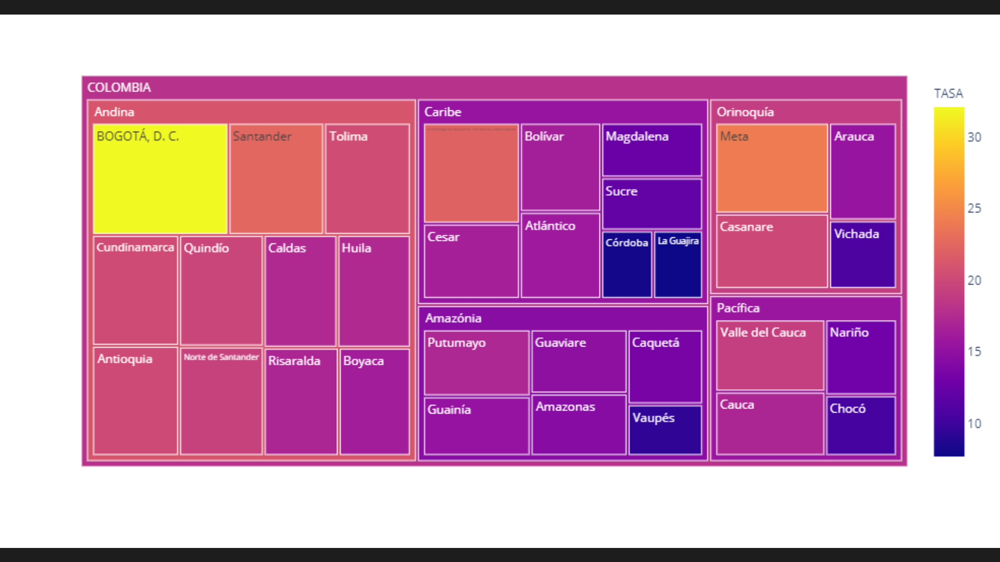

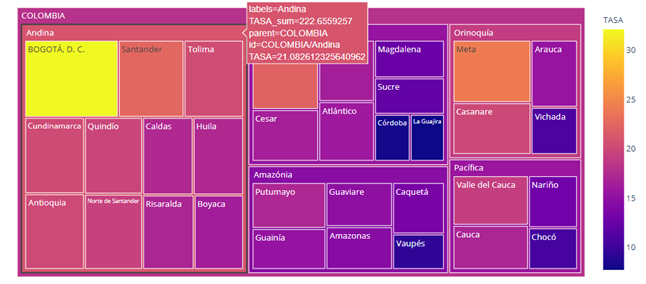

### Marcas y canales 1 modismo: Gabriela Cortés Merchán

Las marcas para el modismo de árboles, especialmente este modismo que se presentó cuenta con marcas de are en el cual se puede evidenciar la repartición entre los departamentos y conjuntamente el tamaño de los que tienen mayor tasa de procesos de delincuencia, por otra parte observamos que usa marcas de color en el cual su tonalidad va a ser distinta si tiene más tasas a si tiene menos tasas, adicionalmente, utiliza un canal de posición  tanto horizontal como vertical. Por otra parte podemos evidenciar que realiza un agrupamiento por región.


### Mejores posibles que le realizaría a la visualización


Sería interesante mirar más allá de los departamentos, adicionalmente sería bueno agregar la tasa a un valor más largo ejemplo de 0 a 100  para que así la suma de las tasas de las regiones  tenga sentido 


### SEGUNDO MODISMO TEMPORAL: GABRIELA CORTÉS MERCHÁN

  **Qué es lo que voy a utilizar:**

Para realizar el Framework y el modismo  temporal, se va a utilizar  las siguientes variables las cuales serán explicadas en el Framework: Departamento, Regiones, Año, Total de procesos y  Tasa. Como podemos evidenciar contamos con dos  variables categóricas, un atributo temporal el cual equivale al la ultima decada y dos variable cuantitativa ordenada.
    
+ **¿Qué es lo que espero?**

Lo que espero de estas variables es poder encontrar:

**1.**	Que comportamiento  tuvieron las tasas  de procesos de delitos en los  departamentos, en la década que ya transcurrió.

**2.**	Como se comportaron las regiones de Colombia en las últimas décadas con respecto a los procesos delictivos.

+  **Modismo Planteado**

**Scatter Temporal:**  Se planteó un Scatter Temporal  para mirar estos objetos, porque, lo que se pretende con este modismo es mirar el comportamiento o las diferencias o bien la dispercion   que el conteo de procesos de delitos  presento en los últimos 10 años, este objetivo surgió del modismo anterior, dado que sería interesante mirar la tasa de delincuencia  por departamento y  regiones  para la última década culminada de la época. Los departamentos se desagregaron a nivel de regiones para obtener una mejor visualización del modismo, conjuntamente se realizó la tasa de delito para el año 2010 al 2020 con las proyecciones que brinda el DANE  y que anterior mente se explicó paso a paso de lo que se hizo, se escogió hasta el año 2020dado que este año actual que esta trascurrió no ha finalizado, por lo tanto no se sabe que delitos vienen a futuro. 


### Framework de la visualización 2 - Gabriela Cortés Merchán

Para realizar el segundo  modismo se seleccionaron las variables Departamento, Regiones, Año, Total de procesos y Tasa delictiva anual, estas variables significan según la ficha técnica de la entidad fiscalía general de la nación lo siguiente:.

+  **DEPARTAMENTO:**  Departamento en donde presuntamente ocurrieron los hechos que conoció la Fiscalía.

+  **REGIONES:**  Regiones en donde presuntamente ocurrieron los hechos que conoció la Fiscalía.

+  **TASA DE DELITO ANUAL:** Tasa del conteo total de las noticias criminales al cruzar las variables anteriores por 1000 habitantes.

+  **AÑO:**  Tiempo en el cual se presentaron conteos totales de  noticias criminales, estos años corresponden  2010 - 2020

+  **TOTAL PROCESOS:**  Conteo total de las noticias criminales al cruzar las variables anteriores.

En este modismo que se presentara a continuación tiene como finalidad encontrar hallazgos acerca de las diferentes regiones y conjuntamente evidenciar visualmente el comportamiento temporal de los departamentos según su tasa de delito anual.
Este modismo fue realizado para proseguir con un objetivo ya propuesto, y brindar análisis más profundos.


+ **¿Qué?**

Por lo anterior el ¿qué? del Framework de Tamara se encuentra evidenciado en que este Dataset cuenta con atributos categóricos para las variables de posición departamento y regiones, cabe decir que en estas posiciones no importa su orden, adicionalmente, cuenta con una variable temporal, la cual tiene una temporal anual, esta variable se encuentra ordenada, tiene una dirección secuencial y hace referencia a los años 2010 al 2020, por otro lado, cuenta con dos variable ordenada cuantitativa para el total de procesos y tasa de delitos, conjuntamente la dirección de estas variables ordenadas (Total de procesos y Tasa de delito) cuentan con una dirección secuencial, esto dado a que parte del punto de que por lo menos se registró un proceso y que la tasa supera al cero, y va realizando un conteo de los mismos.

Por otra parte este tipo de dataset cuenta con diferentes ítems los cuales ya se mencionó, adicionalmente, cuenta con ciertos atributos categóricos y ordenados cuantitativos, con los cuales se puede realizar, tablas, fields dado que hay un orden temporal o temporales, por lo cual, su tipo de dataset puede ser fields tablas o gráficos temporales, de igual manera este dataset es estático, dado que sus datos no se actualizan para años futuros.

+ **¿Por qué?:**

Para realizar el porqué de la siguiente visualización, cabe aclarar que el por qué cuenta con sustantivos, el cual es el encargado de describir objetos y verbos, el cual describe las acciones.

Dicho lo anterior los objetivos o targets que utiliza estos datos podrían ser:

Dado que tenemos un dato temporal anual, variables cuantitativas y cualitativas, es un modismo temporal, en el cual va a importar esa temporalidad en la tasa de delito como ya antes se mencionó, adicionalmente, esta data puede tener valores atípicos, esto porque al comparar un departamento tan grande como es Bogotá con un departamento tan pequeño como lo es Vichada la diferencia van a ser representativa, por lo cual, se decide manejar esto por medio de las tasas de delincuencia, adicionalmente algunos atributos que tiene este targets son varios, los cuales pueden reflejar una tendencia, una correlación o una similitud entre los distintos departamentos y regiones.

Por otra parte, pasando a las acciones o bien a los verbos, podemos evidenciar que podemos realizar un análisis para consumir y presentar, adicionalmente su searh puede estar referenciado para explorar lo que ocurrió en los distintos años o buscar que departamento tuvo cambios más significativos , dado que al realizar el modismo la idea es explorar y buscar cómo se están comportando los departamentos en las diferentes regiones, por otra parte, que departamentos se comportan similar, como fue el cambio en tasas, ocurrió algo sorprende en algún año, adicionalmente, en qué departamento se identifican mayor conteo de procesos, por último, el modismo se plantea para ser una consulta de identificar y comparar.

+ **¿Cómo?**

El ¿cómo? de este modismo  para el Encode  se puede evidenciar  un arange de separación, dado, que se está separando los departamentos según su tasa de delincuencia color, el cual, va a estar ligado a la región que pertenezca, por otro lado hay un tamaño en el cual también va a estar referenciado la tasa por departamento, por otra par su manipulación va  a ser de seleccionar  y navegar , por último se redujo a ciertos filtros que anteriormente se explicaron, para este modismo el filtro fueron los años, para después agrupar y crear una única base y adicionalmente se agregaron las regiones y proyección de población para los 2010 a 2020. 

Antes de proceder a realizar el modismo, rectificamos que la variable temporal esta ordenada, ya que esto es de fundamental importancia

In [22]:
Base_Final.groupby(["AÑO"])["TASA"].sum()

AÑO
2020    549.687796
Name: TASA, dtype: float64


+ **Hallazgos:** 


Dado que con anterioridad como ya se sabía que hacer se arregló la base para los tres modismos, en este caso el segundo modismo  representa un scatter temporal desagregado por regiones, departamentos y años, nos representa por medio de una barra de calor esa tasa, en la cual podemos encontrar ciertos  hallazgos  interesantes, estos hallazgos son:


**1.** Como podemos observar visualmente para el año 2010 el departamento de Guaviare para la región amazonia era un dato muy disperso a comparación de los otros departamentos de esta región con una tasa de delito muy elevada de 30.95, adicionalmente para ese año la tasa con mayor delito para la región andina correspondía a Quindío con un 34.25, inclusivamente esta fue la tasa más grande para todos los departamentos, por otra parte para este mismo año el departamento de meta también era muy disperso con base a los departamentos de la región Orinoquia, por otra parte las regiones caribe y pacifico se comportaban muy homogéneamente 


**2.** Otro hallazgo interesante es que para el año 2011 el departamento de Guaviare paso a ser de una de las variables con mayor tasa y más dispersa a tener la menor tasa de proceso de delitos criminales registrados, la cual paso de un 30.95 a un 5.39, por otra parte en la región andina las variables se estaban comportando muy homogéneo a excepción de Quindío que su tasa siguió aumentando, adicionalmente, para la región Orinoquia meta se convirtió en un dato muy disperso con base en sus demás departamentos


**3.** Otro hallazgo importante que se observó en esta visualización es que para el año 2014 la tasa de procesos de delitos criminales baja abruptamente en todos los departamentos y regiones no superando el 10 * 1000 habitantes.

**4.** Otro dato interesante que se pudo observar es que para los departamentos de la región Andina en el año 2015, estos departamentos se comportaron muy homogéneamente  en el cual su rango de tasa de delito de procesos criminales no superaba el 28 y no disminuía el 17.

**5.** Adicionalmente otro hallazgo que se evidencio correspondió al año 2015 es que para la región caribe archipiélago de San Andrés y Providencia paso en este año a ser un dato atípico para esta región dado su diferencia con respecto a los otros departamentos, y adicionalmente para este año el caribe paso hacer la región más dispersa de todas.
**6.** Otro hallazgo que sobresale es que para el año 2018 Bogotá paso hacer un dato atípico o bien disperso y para el año 2020 todos los departamentos presentaron una leve disminución en la tasa de delitos criminales.


In [23]:
import plotly.express as px
fig = px.scatter(Base_Final, x="POBLACION", y="TASA", animation_frame="AÑO", animation_group="DEPARTAMENTO",
           size="TASA", color="REGIONES", hover_name="DEPARTAMENTO", facet_col="REGIONES",
           log_x=True, size_max=45, range_x=[100,100000], range_y=[25,90])
fig.show()

Al descargar y visualizar el documento descargado se evidencia que no se muestra la imagen con el filtro por lo cual se le toma foto y se muestra, adicionalmente si se corre todo codigo si se evidencia la visualización.

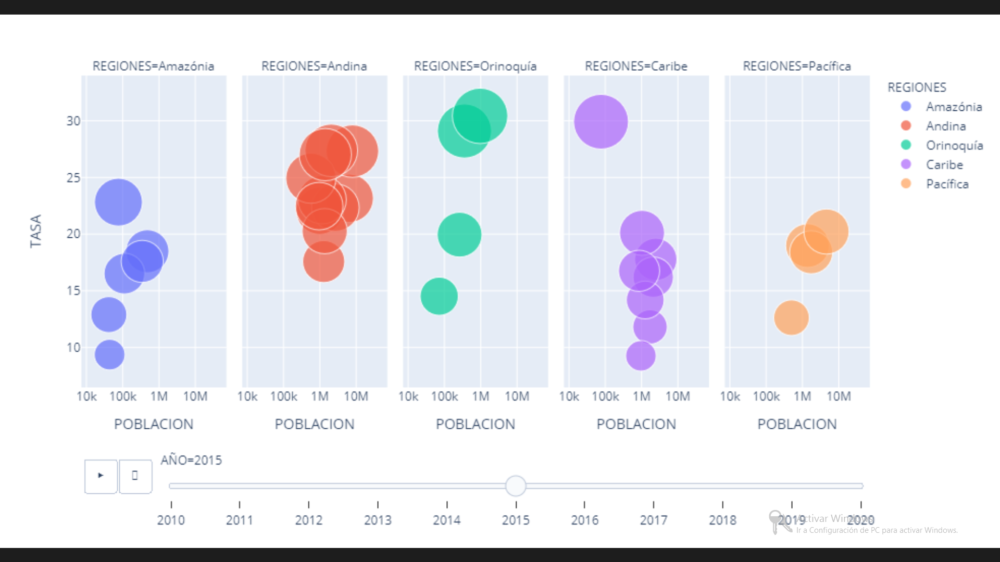

### Marcas y canales 2 modismo: Gabriela Cortés Merchán

Las marcas para el modismo temporal, corresponde a marca de puntos los cuales están representando los departamentos  adicionalmente estos puntos tienen canales de área en los se puede evidenciar si la tasa de delitos de procesos criminales disminuye o por lo contrario aumenta, adicionalmente tiene un canal de color el cual va a estar repartido para las distintas regiones, conjuntamente cuenta con un canal de posición espacial horizontal para el atributo ordenado cuantitativo total de población y un canal de posición espacial vertical para el atributo cuantitativo tasa de delitos anuales


### Mejores posibles que le realizaría a la visualización

Las mejoras que yo le haría a ese modismo seria encontrar la manera de indicar que departamento que punto dado que se evidencian y la interactividad nos ayuda a verlo pero solo si te paras en ese punto en específico y al ser un modismo temporal los años pasan tan rápido que te toca mirar año por año que paso por que a simple vista no se evidencia muy bien.


### TERCER  MODISMO ESPACIAL: GABRIELA CORTÉS MERCHÁN

Antes de realizar el modismo espacial se va arreglar la base según el objetivo el cual corresponde a saber por medio de un mapa que grupo delictivo tuvo mayor total de procesos, adicionalmente para que año se tuvieron mayor cantidad de procesos, esto con la finalidad  de saber  cómo se está comportando los departamentos para estos filtros en especial y en qué departamento hay una mayor tasa de delitos criminales. 

Para arreglar la base lo primero que se procede a realizar es el agrupamiento por grupo de delito y total de procesos, en el cual cómo podemos observar encontramos que hubo más procesos delictivos para el delito de Hurto con un total  de procesos criminales del  3425014.


In [24]:
CONTEO_DE_PROCESOS.groupby(["GRUPO_DELITO"])["TOTAL_PROCESOS"].sum()

GRUPO_DELITO
ABORTO                                        4478
ACTOS DE DISCRIMINACION                       2307
ADMINISTRACION PUBLICA                      130844
AMENAZAS                                    488077
CONCIERTO PARA DELINQUIR                     50660
CONSTRENIMIENTO                              99074
CONTRA LA FAMILIA                           713162
CORRUPCION ADMINISTRATIVA                    74547
CORRUPCION ELECTORAL                         12187
CORRUPCION JUDICIAL                         131047
CORRUPCION PRIVADA                           22106
CORRUPCION TRIBUTARIA                        59699
DELITOS AMBIENTALES                          42216
DELITOS INFORMATICOS                        162170
DELITOS SEXUALES                            399390
DERECHOS DE AUTOR                            16137
DERECHOS DE REUNION Y ASOCIA.                 2794
DESAPARICION FORZADA                         33347
DESPLAZAMIENTO                               55182
ESTAFA            

Al encontrar el valor máximo para total de procesos se procede a  realizar un filtro en donde solo se encuentre el grupo de delito hurto 

In [25]:
HURTO = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS.GRUPO_DELITO.isin(['HURTO'])]
HURTO.head()

,Unnamed: 0,HECHO,RUPTURA,CONEXO,ESTADO_NOTICIA,ETAPA,ANIO_DENUNCIA,ANIO_ENTRADA,ANIO_HECHO,LEY,PAIS,DEPARTAMENTO,MUNICIPIO,SECCIONAL,GRUPO_DELITO,DELITO,CAPTURA,IMPUTACION,CONDENA,ACUSACION,HOMICIDIO_DOLOSO_CONSUMADO,TOTAL_PROCESOS
1,1,SI,NO,NO,ACTIVO,INDAGACIÓN,2020,2020,2020,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,HURTO,HURTO. ART. 239 C.P. AGRAVADO CUANDO LO HURTAD...,NO,NO,NO,NO,NO,891
2,2,SI,NO,NO,ACTIVO,JUICIO,2020,2020,2020,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,HURTO,HURTO CALIFICADO MENOR CUANTIA ART. 240 C.P. ...,NO,SI,NO,NO,NO,284
10,10,SI,NO,NO,INACTIVO,INDAGACIÓN,2016,2016,2016,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,HURTO,HURTO CALIFICADO. ART. 240 C.P.,NO,NO,NO,NO,NO,8019
11,11,SI,NO,NO,INACTIVO,INDAGACIÓN,2011,2011,2011,Ley 906,Colombia,Meta,VILLAVICENCIO,DIRECCIÓN SECCIONAL DE META,HURTO,HURTO CALIFICADO ART. 240 C.P. AGRAVADO CUAND...,NO,NO,NO,NO,NO,255
19,19,SI,NO,SI,INACTIVO,INDAGACIÓN,2016,2016,2016,Ley 906,Colombia,Valle del Cauca,CALI,DIRECCIÓN SECCIONAL DE CALI,HURTO,HURTO ART. 239 C.P. AUTOMOTOR MAYOR CUANTIA,NO,NO,NO,NO,NO,1786


Al tener nuestro primer filtro para realizar nuestro objetivo, procedemos a realizar el segundo filtro el cual corresponde a primero saber en qué año hubieron más procesos criminales, tanto en el año de entrada, año de denuncia y año de hecho, el cual procedió en los tres escenarios al año 2019. 

In [26]:
HURTO.groupby(["ANIO_HECHO"])["TOTAL_PROCESOS"].sum()

ANIO_HECHO
2010    228814
2011    245022
2012    247260
2013    258229
2014    269565
2015    276090
2016    306207
2017    365607
2018    422290
2019    463658
2020    320552
2021     21720
Name: TOTAL_PROCESOS, dtype: int64

In [27]:
HURTO_D = HURTO[HURTO['ANIO_DENUNCIA']==2019]
HURTO_E = HURTO_D[HURTO_D['ANIO_ENTRADA']==2019]
HURTO = HURTO_E[HURTO_E['ANIO_HECHO']==2019]
HURTO.head()

,Unnamed: 0,HECHO,RUPTURA,CONEXO,ESTADO_NOTICIA,ETAPA,ANIO_DENUNCIA,ANIO_ENTRADA,ANIO_HECHO,LEY,PAIS,DEPARTAMENTO,MUNICIPIO,SECCIONAL,GRUPO_DELITO,DELITO,CAPTURA,IMPUTACION,CONDENA,ACUSACION,HOMICIDIO_DOLOSO_CONSUMADO,TOTAL_PROCESOS
189,190,SI,NO,NO,ACTIVO,INDAGACIÓN,2019,2019,2019,Ley 906,Colombia,Valle del Cauca,TULUÁ,DIRECCIÓN SECCIONAL DE VALLE DEL CAUCA,HURTO,HURTO. ART. 239 C.P.,SI,NO,NO,NO,NO,3
242,243,SI,NO,NO,ACTIVO,JUICIO,2019,2019,2019,Ley 1098,Colombia,Atlántico,BARRANQUILLA,DIRECCIÓN SECCIONAL DE ATLÁNTICO,HURTO,HURTO CALIFICADO ART. 240 C.P. MENOR CUANTIA,NO,SI,NO,NO,NO,5
255,256,SI,NO,NO,INACTIVO,INDAGACIÓN,2019,2019,2019,Ley 906,Colombia,Antioquia,SEGOVIA,DIRECCIÓN SECCIONAL DE ANTIOQUIA,HURTO,HURTO. ART. 239 C.P.,NO,NO,NO,NO,NO,36
270,271,SI,NO,NO,ACTIVO,INDAGACIÓN,2019,2019,2019,Ley 906,Colombia,Boyaca,SOTAQUIRÁ,DIRECCIÓN SECCIONAL DE BOYACÁ,HURTO,HURTO. ART. 239 C.P.,NO,NO,NO,NO,NO,4
494,495,SI,NO,NO,INACTIVO,INDAGACIÓN,2019,2019,2019,Ley 906,Colombia,Putumayo,VALLE DEL GUAMUEZ,DIRECCIÓN SECCIONAL DE PUTUMAYO,HURTO,HURTO. ART. 239 C.P. AGRAVADO CUANDO LO HURTAD...,NO,NO,NO,NO,NO,12


Al tener los filtros que se desean obtener para la visualización se procede a seleccionar solo las variables que van a tener que ser utilizadas.

In [28]:
HURTO = HURTO.iloc[:,[8,11,14,21]]
HURTO.head()

,ANIO_HECHO,DEPARTAMENTO,GRUPO_DELITO,TOTAL_PROCESOS
189,2019,Valle del Cauca,HURTO,3
242,2019,Atlántico,HURTO,5
255,2019,Antioquia,HURTO,36
270,2019,Boyaca,HURTO,4
494,2019,Putumayo,HURTO,12


In [29]:
HURTO.shape

(25902, 4)

Ahora bien se va a proceder a realizar el cruce de variable por departamento, con la finalidad de realizar la tasa para el año 2019, pero con base a la base arreglada.

In [30]:
BASE_AGRUPADA = pd.DataFrame(HURTO.groupby(["DEPARTAMENTO"])["TOTAL_PROCESOS"].sum())

BASE = BASE_AGRUPADA.merge(df_poblacion_pro,
                           left_on='DEPARTAMENTO',
                           right_on='DEPARTAMENTO',
                           how = 'outer')
print('Dimension bases unidas: ', BASE.shape)
print('Dimension Condeos por departamento: ', BASE_AGRUPADA.shape)
print('Dimension poblacion por departamento: ', df_poblacion_pro.shape)
BASE['TASA'] = (BASE['TOTAL_PROCESOS']/BASE['POBLACION_2019'])*1000


Dimension bases unidas:  (33, 17)
Dimension Condeos por departamento:  (33, 1)
Dimension poblacion por departamento:  (33, 16)


La base final para este modismo quedo de la siguiente manera:

In [31]:
BASE_F = BASE.drop(columns= ['POBLACION_2010','POBLACION_2011','POBLACION_2012','POBLACION_2013','POBLACION_2014',
                          'POBLACION_2015','POBLACION_2016','POBLACION_2017','POBLACION_2017',
                          'POBLACION_2018','POBLACION_2019','POBLACION_2020'], axis=1)

BASE_F['GRUPO_DELITO'] = "HURTO"
BASE_F['AÑO'] = 2019
BASE_F.head()

,DEPARTAMENTO,TOTAL_PROCESOS,id,REGIONES,LAT,LON,TASA,GRUPO_DELITO,AÑO
0,Amazonas,394,91,Amazónia,-3.269956,-70.432942,4.941120,HURTO,2019
1,Antioquia,60225,5,Andina,6.722434,-75.624600,8.898017,HURTO,2019
2,Arauca,1277,81,Orinoquía,6.744565,-71.501745,4.672162,HURTO,2019
3,"Archipiélago de San Andrés, Providencia y Sant...",664,88,Caribe,13.062639,-81.499283,8.398685,HURTO,2019
4,Atlántico,20556,8,Caribe,10.691145,-74.983617,7.986585,HURTO,2019


**Qué es lo que voy a utilizar:**

Para realizar el Framework y el modismo espacial, se va a utilizar  las siguientes variables las cuales serán explicadas en el Framework: Departamento, Regiones, Año, Total de procesos y  Tasa de criminalidad, grupo de delito, latitud y longitud. Como podemos evidenciar contamos con tres  variables categóricas, un atributo temporal el cual equivale al año 2019 y tres variable cuantitativa ordenada y dos variables cuantitativas de posición.
    
+ **¿Qué es lo que espero?**

Lo que espero de estas variables es poder encontrar:

**1.**	En qué departamento se evidenciaron mayor número de tasa de procesos criminales  según el delito con mayor total de procesos y según el año que tiene mayor cantidad de procesos criminales

**2.**	Como se comportaron los departamentos frente al grupo de delita con mayor cantidad de procesos criminales

+  **Modismo Planteado**

**Mapa de puntos:**  Se planteó un Mapa de puntos para tener un panorama más amplio de los departamentos con mayor cantidad de hurtos, se decidió plantear un mapa geométrico dado que se contaba con el atributo departamento y con sus respectivas posiciones espaciales de latitud y longitud.


### Framework de la visualización 3 - Gabriela Cortés Merchán

Para realizar el tercer  modismo se seleccionaron las variables Departamento, Regiones, Año, Total de procesos y  Tasa de criminalidad, grupo de delito, latitud y longitud, estas variables significan según la ficha técnica de la entidad fiscalía general de la nación lo siguiente:.

+  **DEPARTAMENTO:**  Departamento en donde presuntamente ocurrieron los hechos que conoció la Fiscalía.

+  **REGIONES:**  Regiones en donde presuntamente ocurrieron los hechos que conoció la Fiscalía.

+  **TASA DE DELITO ANUAL:** Tasa del conteo total de las noticias criminales al cruzar las variables anteriores por 1000 habitantes.

+  **AÑO:**  Tiempo en el cual se presentaron conteos totales de  noticias criminales, estos años corresponden  2010 - 2020

+  **TOTAL PROCESOS:**  Conteo total de las noticias criminales al cruzar las variables anteriores.

+ **GRUPO DE DELITO:** Grupo al que pertenece  las noticias criminales
+   ** LATITUD:** Coordenadas de latitud con respecto a los departamentos
+  ** LONGITUD:** Coordenadas de longitud  con respecto a los departamentos

En este modismo que se presentara a continuación tiene como finalidad encontrar hallazgos acerca del comportamiento de los departamentos según su tasa de delito para el año 2019 y que corresponden a la criminalidad  de hurto.


+ **¿Qué?**

Por lo anterior el ¿qué? del Framework de Tamara se encuentra evidenciado en que este Dataset cuenta con atributos categóricos para las variables de posición departamento, regiones y grupo de delito, cabe decir que en estas posiciones no importa su orden, adicionalmente, cuenta con una variable temporal que corresponde al año 2019, por otro lado, cuenta con tres variable ordenada cuantitativa para el total de procesos, id y  tasa de delitos, conjuntamente la dirección de estas variables ordenadas cuentan con una dirección secuencial, esto dado a que parte del punto de que por lo menos se registró un proceso y que la tasa supera al cero,  y el id parte de una identificación mayor a cero y va realizando un conteo de los mismos.

Por otra parte este tipo de dataset cuenta con diferentes ítems los cuales ya se mencionó, adicionalmente, cuenta con  posiciones, atributos categóricos y ordenados cuantitativos, con los cuales se puede realizar, tablas y geometría espacial,  dado que hay una posicion la cual su orden no importa, por lo cual, de igual manera este dataset es estático, dado que sus datos no se actualizan para años futuros.


+ **¿Por qué?**

Para realizar el porqué de la siguiente visualización, cabe aclarar que el por qué cuenta con sustantivos, el cual es el encargado de describir objetos y verbos, el cual describe las acciones.
Dicho lo anterior los objetivos o targets que utiliza estos datos podrían ser:
Dado que tenemos un datos de posición el cual los órdenes no importan, variables cuantitativas y cualitativas, es un modismo espacial shape, en el cual va a importar esa posición en la tasa de delito como ya antes se mencionó, adicionalmente, esta data puede tener valores atípicos, esto porque al comparar un departamento tan grande como es Bogotá con un departamento tan pequeño como lo es Vichada la diferencia van a ser representativa, por lo cual, se decide manejar esto por medio de las tasas de delincuencia, adicionalmente algunos atributos que tiene este targets son varios, los cuales pueden reflejar una similitud entre departamentos.


Por otra parte, pasando a las acciones o bien a los verbos, podemos evidenciar que podemos realizar un análisis para consumir y presentar, adicionalmente su searh puede estar referenciado para un lookup o browse, buscar que departamento tuvo cambios más significativos , dado que al realizar el modismo la idea es navegar y buscar cómo se están comportando los departamentos con ciertas características en específico, adicionalmente, en qué departamento se identifican mayor conteo de procesos, por último, el modismo se plantea para ser una consulta de identificar y comparar


+ **¿Cómo?**

El ¿cómo? de este modismo para el Encode se puede evidenciar un arange de use, dado, que se está usando los departamentos según su tasa de delincuencia, delito de hurto y año 2019, color, el cual, va a estar ligado a la saturación de la tasa si tuvo más proceso o los procesos criminales son bajos,, por otro lado hay un tamaño en el cual también va a estar referenciado la tasa por departamento, por otra par su manipulación va a ser de seleccionar y navegar , por último se redujo a ciertos filtros que anteriormente se explicaron, para este modismo el filtro fue el año 2019 y el grupo de delito de hurto, para después agrupar y crear una única base y adicionalmente se agregaron las regiones y proyección de población para los 2019  y también se agregó las latitudes y longitudes.

+ **Hallazgos** 

**1.** Como se puede evidenciar visualmente se presentaron para el año 2019 y el grupo de delito hurto más casos en el departamento de Bogotá con una tasa de  19.1965, es decir que por cada 1000 habitantes se presentan 19 hurto, adicionalmente para este año se puede evidenciar que también hubo mayor cantidad de s criminalidad en  hurto  para los alrededores de Bogotá 


In [32]:
import plotly.express as px

fig = px.scatter_mapbox(BASE_F, lat="LAT", lon="LON", color="TASA", size="TASA",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15,
                  mapbox_style="open-street-map",zoom=4, center = {"lat": 4.570868, "lon": -74.297333})

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


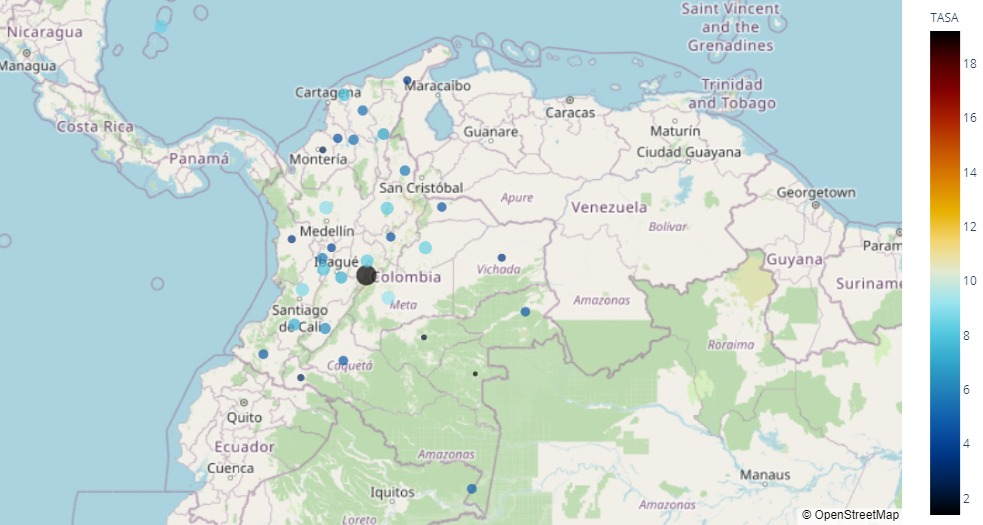

### Marcas y canales 3 modismo: Gabriela Cortés Merchán

Las marcas para el modismo temporal, corresponde a marca de puntos los cuales están representando los departamentos  adicionalmente estos puntos tienen canales de área en los se puede evidenciar si la tasa de delitos de procesos criminales disminuye o por lo contrario aumenta, tiene interactividad,  adicionalmente tiene un canal de color el cual va a estar repartido para las distintos niveles de tasa de delito, conjuntamente cuenta con un canal de posición espacial geométrica para el mapa de Colombia.


### Mejores posibles que le realizaría a la visualización

Las mejoras que yo le haría al modismo seria el color en el cual está clasificando la tasa dado que si observamos para la más alta como para la más baja es el mismo tono de color, adicionalmente la desagregaría por municipio para saber que está pasando dentro de esos departamentos, seria bueno agregarle el nombre de departamento cuando uno se para en la interactividad y que no este solo la latitud y longitud 



## JUAN D. SARMIENTO PÁRAMO

### __Framework de la visualización- Juan D. Sarmiento-Páramo__

Para realizar el primer modismo se seleccionaron las variables:  

+ Anio_hecho
+ Anio_denuncia
+ Departamento 
+ Grupo de delito 
+ Captura 
+ Condena 

para la variable grupo de delito se seleccionó solo trabajar únicamente con las siguientes clasificaciones: 

+ Actos de discriminación 
+ Delitos sexuales
+ Desaparición forzada
+ Extorción
+ Feminicidio
+ Reclutamiento ilicito
+ Trata de personas
+ Uso de menores de edad
+ Violencia intrafamiliar

estas variables significan según la ficha técnica de la entidad fiscalía general de la nación lo siguiente:


+ **Anio_hecho:** Año en que presuntamente ocurrió el hecho.
+ **Anio_denuncia:** Año en el que se denunció el hecho.
+ **Departamento:** Departamento en donde presuntamente ocurrieron los hechos que conoció la Fiscalía.
+ **Grupo de delito:**  Agrupación de los delitos del Código Penal.
+ **Captura:** Indica si el caso tiene o no alguna actuación de captura.
+ **Condena:** Indica si el caso tiene o no alguna actuación de condena.


El siguiente modismo tiene como finalidad observar en primera instancia por departamento el número de delitos de los que se tiene información en la base de datos para cada departamento, el número de capturas y no capturas, así como el número de condenados y no condenados tanto por departamento como por grupo de delito. Posterior a esto se construye unas gráficas temporales con fin de identificar el comportamiento de los reportes de delitos para los grupos seleccionados en dos departamentos específicos.


#### ¿Qué?


Por lo anterior el ¿qué? del Framework de Tamara se encuentra evidenciado en que este Dataset cuenta con atributos categóricos para todas las variables menos las de año puesto que estás son una variables ordenadas y secuenciales, por su parte las variables capturan, imputación y condena son variables de escala binaria.
Por último, su tipo de dataset puede ser una tabla o incluso una geometry (spatial), y conjuntamente la disponibilidad de este conjunto de datos es estática, ya que son datos que ya no van a cambiar, es decir, solo se realiza el estudio para los datos que hay hasta el día de la descarga. Cabe además resaltar que la data es de carácter estática, corresponde a una tabla que plasma una "fotografía" de los datos, pero esta no se va a ir actualizando a no ser que sea actualizada en [Datos Abiertos](https://www.datos.gov.co/Justicia-y-Derecho/Conteo-de-Procesos/q6re-36rh) 


#### ¿Por qué?

Para realizar el porqué de la siguiente visualización, cabe aclarar que el por qué cuenta con sustantivos, el cual es el encargado de describir objetos y verbos, el cual describe las acciones.
Dicho lo anterior los objetivos o targets que utiliza estos datos podrían ser: El departamento y algunas variables categóricas y de tiempo, se podría realizar una Data espacial, adicionalmente, esta data puede tener valores atípicos, esto porque al comparar un departamento tan grande como es Bogotá como un departamento tan pequeño como lo es Vichada la diferencia va a ser representativa, y por esto la última etapa de la visualización buscará mostrar el comportamiento por separado para los municipios con más información.

Por otra parte, pasando a las acciones o bien a los verbos, podemos evidenciar que podemos realizar un análisis para consumir y presentar, adicionalmente su searh puede estar referenciado con un lookup, dado que al realizar el modismo la idea es idéntica el volumen de los delitos para cada departamento e identificar casos donde no se haya ocurrido captura, imputación de delitos o condena para los municipios con mayor cantidad de información y su comportamiento a lo largo de los años, el modismo se plantea para ser una consulta de identificar, comparar e informar de manera sencilla e intuitiva la información. 


#### ¿Cómo?
En primera instancia se realizá una visualización para datos multivariados especificamente un heat map, posterior para datos temporales se utiliza un gráfico de linea y finlamnete se realizá una visualización espacial, las marcas y canales para cada uno se explicarán a detalle en cada visualización.

### PRIMER MODISMO MULTIVARIADO: JUAN D. SARMIENTO PÁRAMO

PPara estás visualizaciones las cuales son mapas de calor se emplea: 
+ Marcas:
	+ Posición para ordenar en el eje x y en el eje y las categorías
+ Canales: 
	+ Color la cual tiene como objetivo mostrar que a mayor intensidad en el color rojo mayor número de esa categoría tiene adicional a mostrar el número puesto que el color no es perceptible si el cambio en el número no es muy grande.

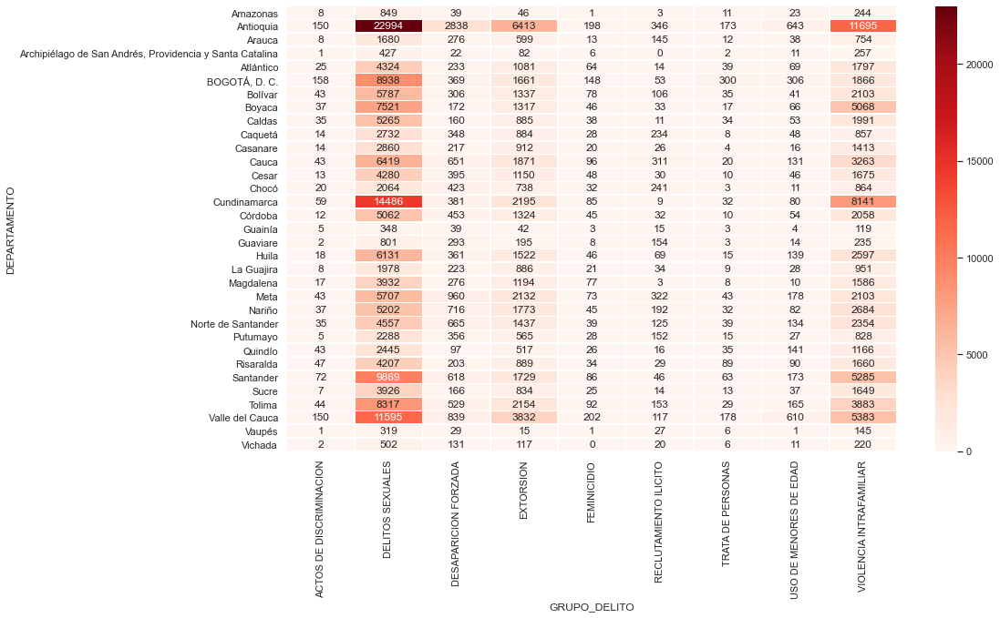

In [33]:
CONTEO_DE_PROCESOS1 = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS.GRUPO_DELITO.isin(["DELITOS SEXUALES",'EXTORSION','VIOLENCIA INTRAFAMILIAR',
                                                                              'DESAPARICION FORZADA',"ACTOS DE DISCRIMINACION",
                                                                              'FEMINICIDIO','RECLUTAMIENTO ILICITO','TRATA DE PERSONAS',
                                                                              'USO DE MENORES DE EDAD',"ACTOS DE DISCRIMINACION"])]

tab1 = pd.crosstab(CONTEO_DE_PROCESOS1["DEPARTAMENTO"],CONTEO_DE_PROCESOS1["GRUPO_DELITO"])

ax = sns.heatmap(tab1,
                 annot=True, 
                 fmt="d",
                 linewidths=.5,
                 cmap="Reds")

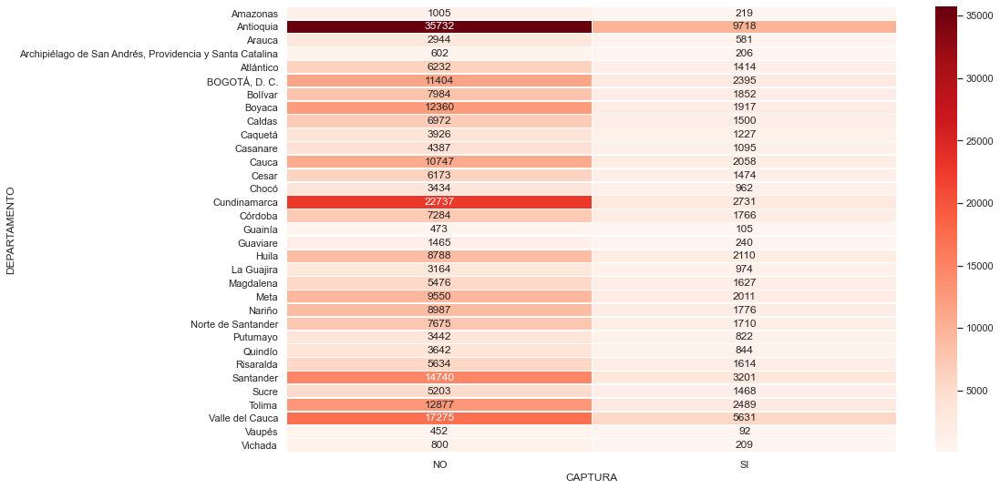

In [34]:
tab1 = pd.crosstab(CONTEO_DE_PROCESOS1["DEPARTAMENTO"],CONTEO_DE_PROCESOS1["CAPTURA"])

ax = sns.heatmap(tab1,
                 annot=True, 
                 fmt="d",
                 linewidths=.5,
                 cmap="Reds")

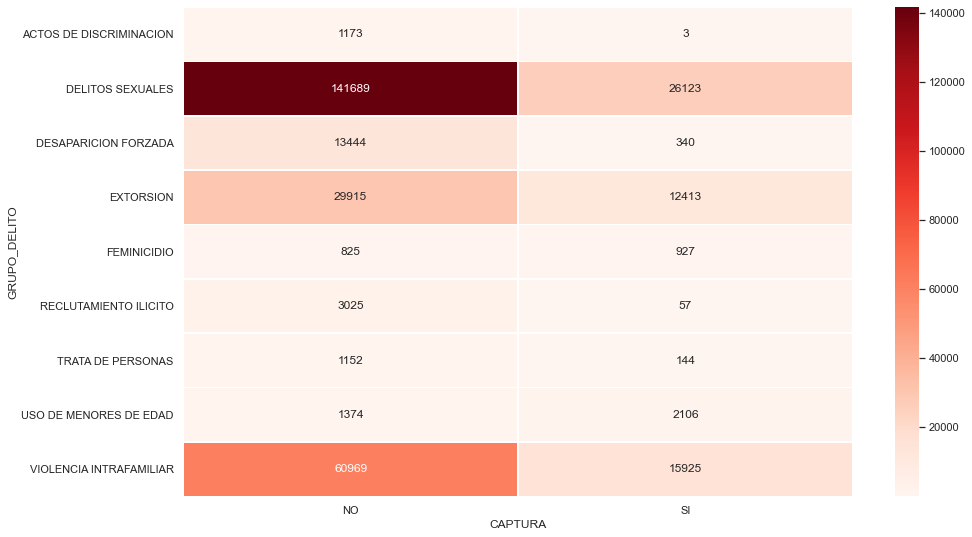

In [35]:
tab1 = pd.crosstab(CONTEO_DE_PROCESOS1["GRUPO_DELITO"],CONTEO_DE_PROCESOS1["CAPTURA"])

ax = sns.heatmap(tab1,
                 annot=True, 
                 fmt="d",
                 linewidths=.5,
                 cmap="Reds")


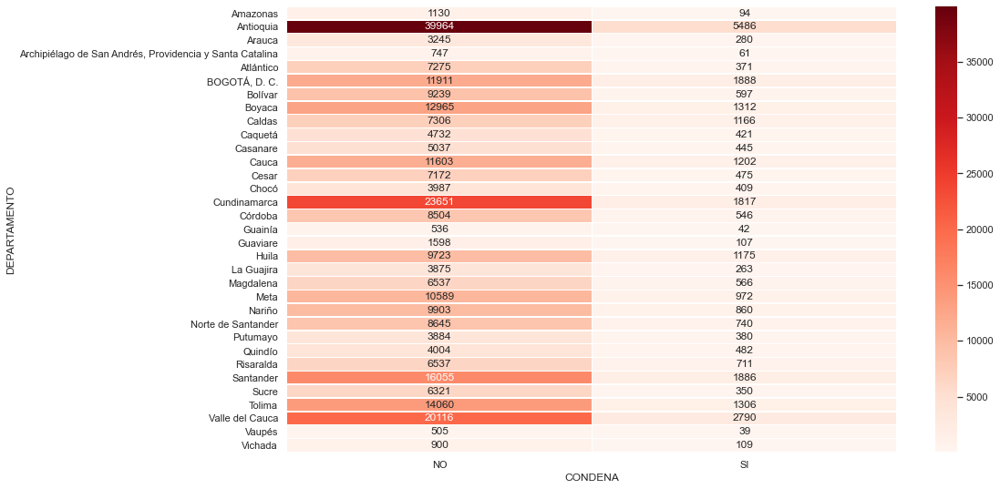

In [36]:
tab1 = pd.crosstab(CONTEO_DE_PROCESOS1["DEPARTAMENTO"],CONTEO_DE_PROCESOS1["CONDENA"])

ax = sns.heatmap(tab1,
                 annot=True, 
                 fmt="d",
                 linewidths=.5,
                 cmap="Reds")


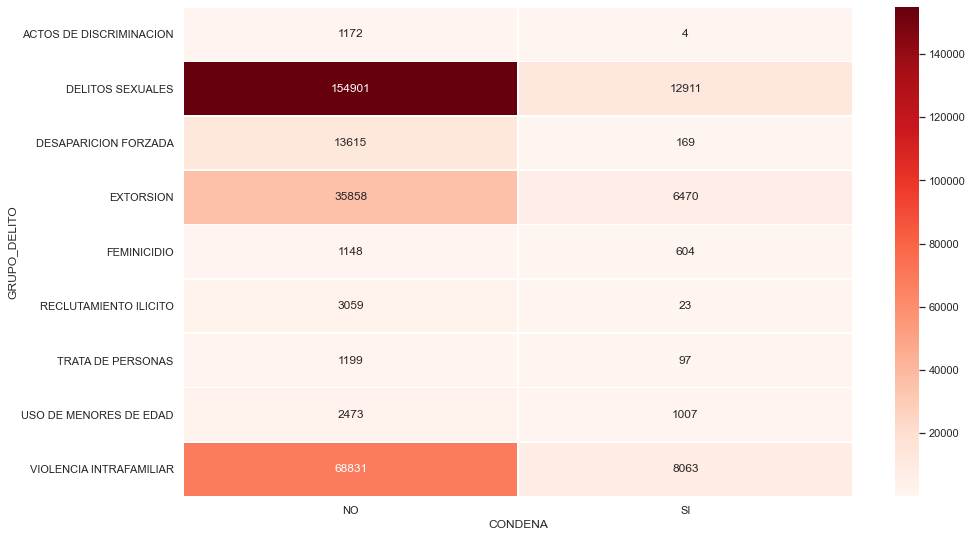

In [37]:
tab1 = pd.crosstab(CONTEO_DE_PROCESOS1["GRUPO_DELITO"],CONTEO_DE_PROCESOS1["CONDENA"])

ax = sns.heatmap(tab1,
                 annot=True, 
                 fmt="d",
                 linewidths=.5,
                 cmap="Reds")


### SEGUNDO MODISMO TEMPORAL: JUAN D. SARMIENTO PÁRAMO

Para estás visualizaciones la cual son gráficos de líneas: 
+ Marcas:
	+ Línea, la cual nos permite ver el movimiento a través del tiempo.
+ Canales: 
	+ Color, azúl para el año del hehco y naranja para el año de la denuncia.

In [38]:
CONTEO_DE_PROCESOS_2020 = CONTEO_DE_PROCESOS1[(CONTEO_DE_PROCESOS1['ANIO_HECHO'] == 2020)]

CONTEO_DE_PROCESOS_2020 = pd.pivot_table(CONTEO_DE_PROCESOS_2020, 
                                values='TOTAL_PROCESOS', 
                                index=['DEPARTAMENTO'],
                                aggfunc=np.sum)

CONTEO_DE_PROCESOS_2020 = pd.DataFrame(CONTEO_DE_PROCESOS_2020)
CONTEO_DE_PROCESOS_2020.reset_index(inplace=True)
CONTEO_DE_PROCESOS_2020.dtypes
CONTEO_DE_PROCESOS_2020.head()

,DEPARTAMENTO,TOTAL_PROCESOS
0,Amazonas,195
1,Antioquia,21745
2,Arauca,764
3,"Archipiélago de San Andrés, Providencia y Sant...",266
4,Atlántico,4176


In [39]:
CONTEO_DE_PROCESOS_CHOCO = CONTEO_DE_PROCESOS1[(CONTEO_DE_PROCESOS1['DEPARTAMENTO'] == "Chocó")]


Conteo_choco = pd.pivot_table(CONTEO_DE_PROCESOS_CHOCO, 
                                values='TOTAL_PROCESOS', 
                                index=['ANIO_HECHO'],
                                aggfunc=np.sum)

Conteo_choco = pd.DataFrame(Conteo_choco)
Conteo_choco.reset_index(inplace=True)
Conteo_choco.dtypes

Conteo_choco2 = pd.pivot_table(CONTEO_DE_PROCESOS_CHOCO, 
                                values='TOTAL_PROCESOS', 
                                index=['ANIO_DENUNCIA'],
                                aggfunc=np.sum)

Conteo_choco2 = pd.DataFrame(Conteo_choco2)
Conteo_choco2.reset_index(inplace=True)
Conteo_choco2.dtypes

ANIO_DENUNCIA     int64
TOTAL_PROCESOS    int64
dtype: object

In [40]:
Conteo_choco.head()

,ANIO_HECHO,TOTAL_PROCESOS
0,2010,587
1,2011,769
2,2012,920
3,2013,916
4,2014,911


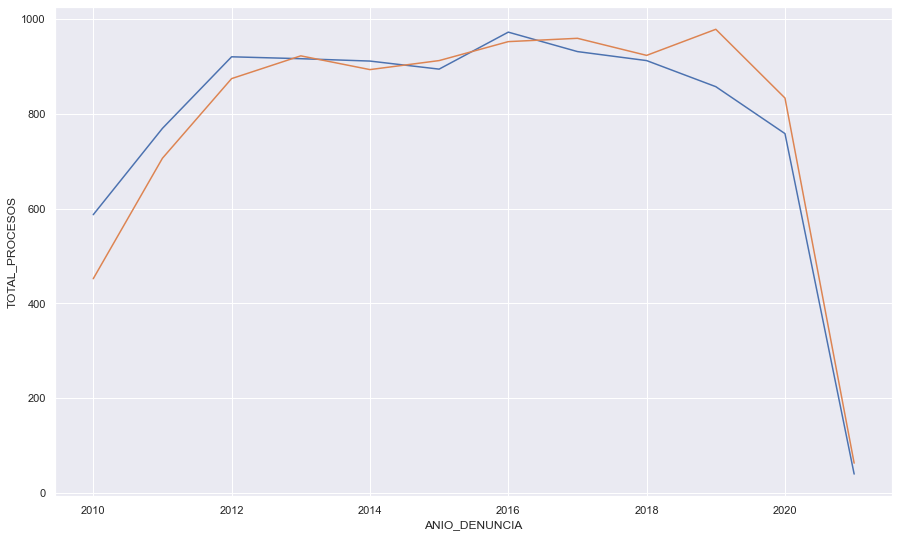

In [41]:
sns.lineplot(data=Conteo_choco, x="ANIO_HECHO", y="TOTAL_PROCESOS")
sns.lineplot(data=Conteo_choco2, x="ANIO_DENUNCIA", y="TOTAL_PROCESOS")
plt.ticklabel_format(style='plain', axis='y')
ax = plt.gca()

plt.show()

In [42]:
CONTEO_DE_PROCESOS_ANTIOQUIA = CONTEO_DE_PROCESOS1[(CONTEO_DE_PROCESOS1['DEPARTAMENTO'] == "Antioquia") ]


CONTEO_DE_PROCESOS_ANTIOQUIA1 = pd.pivot_table(CONTEO_DE_PROCESOS_ANTIOQUIA, 
                                values='TOTAL_PROCESOS', 
                                index=['ANIO_HECHO'],
                                aggfunc=np.sum)

CONTEO_DE_PROCESOS_ANTIOQUIA1 = pd.DataFrame(CONTEO_DE_PROCESOS_ANTIOQUIA1)
CONTEO_DE_PROCESOS_ANTIOQUIA1.reset_index(inplace=True)
CONTEO_DE_PROCESOS_ANTIOQUIA1.dtypes
CONTEO_DE_PROCESOS_ANTIOQUIA1.head()

,ANIO_HECHO,TOTAL_PROCESOS
0,2010,20716
1,2011,22822
2,2012,20983
3,2013,21412
4,2014,20557


In [43]:
CONTEO_DE_PROCESOS_ANTIOQUIA2 = pd.pivot_table(CONTEO_DE_PROCESOS_ANTIOQUIA, 
                                values='TOTAL_PROCESOS', 
                                index=['ANIO_DENUNCIA'],
                                aggfunc=np.sum)

CONTEO_DE_PROCESOS_ANTIOQUIA2 = pd.DataFrame(CONTEO_DE_PROCESOS_ANTIOQUIA2)
CONTEO_DE_PROCESOS_ANTIOQUIA2.reset_index(inplace=True)
CONTEO_DE_PROCESOS_ANTIOQUIA2.dtypes
CONTEO_DE_PROCESOS_ANTIOQUIA2.head()

,ANIO_DENUNCIA,TOTAL_PROCESOS
0,2010,17982
1,2011,23135
2,2012,20308
3,2013,20982
4,2014,20038


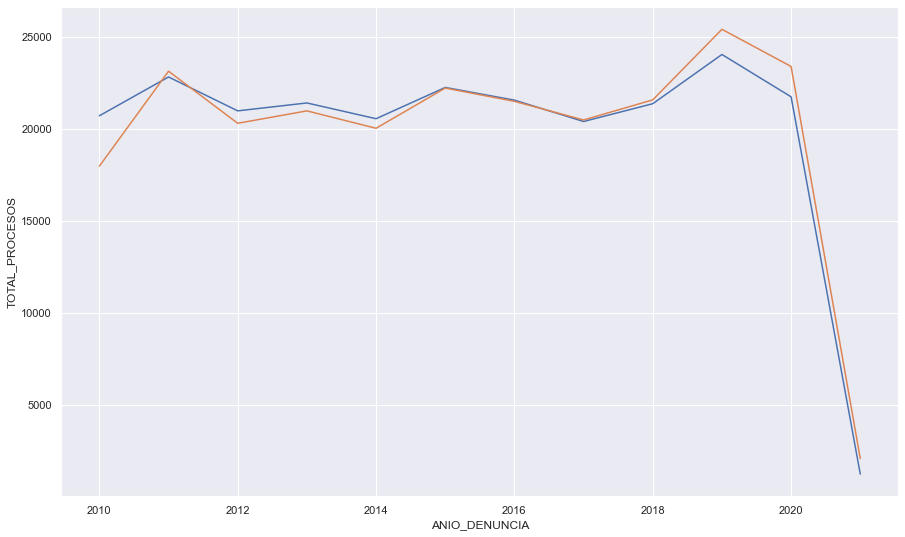

In [44]:
sns.lineplot(data=CONTEO_DE_PROCESOS_ANTIOQUIA1, x="ANIO_HECHO", y="TOTAL_PROCESOS")
sns.lineplot(data=CONTEO_DE_PROCESOS_ANTIOQUIA2, x="ANIO_DENUNCIA", y="TOTAL_PROCESOS")
plt.ticklabel_format(style='plain', axis='y')
ax = plt.gca()
plt.show()

### TERCER MODISMO ESPACIAL: JUAN D. SARMIENTO PÁRAMO


Para está visualización la cual es un mapa cloroplasto de Colombia.  
+ Marcas:
	+ Espacial, la cual nos permite identificar los diferentes departamentos y su ubicación geográfica.
+ Canales: 
	+ Color, el cual varía según la cantidad de procesos que hay en el histórico del departamento.

In [45]:
Departamentos = pd.pivot_table(CONTEO_DE_PROCESOS1, 
                                values='TOTAL_PROCESOS', 
                                index=['DEPARTAMENTO'],
                                aggfunc=np.sum)

Departamentos = pd.DataFrame(Departamentos)
Departamentos.reset_index(inplace=True)
Departamentos.dtypes
Departamentos.head()

,DEPARTAMENTO,TOTAL_PROCESOS
0,Amazonas,3153
1,Antioquia,239142
2,Arauca,9427
3,"Archipiélago de San Andrés, Providencia y Sant...",2427
4,Atlántico,52403


In [46]:
#Departamentos.to_csv("Departamentos.csv")

In [47]:
Departamentos = pd.read_excel("C:/Users/Gabriela C/Desktop/departamentos_juan.xlsx"
                       )
Departamentos.head()

,id,DEPARTAMENTO,TOTAL_PROCESOS,lat,lon
0,91,AMAZONAS,3153,-3.269956,-70.432942
1,5,ANTIOQUIA,239142,6.722434,-75.624600
2,81,ARAUCA,9427,6.744565,-71.501745
3,88,"ARCHIPIÉLAGO DE SAN ANDRÉS, PROVIDENCIA Y",2427,13.062639,-81.499283
4,8,ATLÁNTICO,52403,10.691145,-74.983617


In [48]:
from urllib.request import urlopen
import json
with urlopen('https://gist.githubusercontent.com/john-guerra/43c7656821069d00dcbc/raw/be6a6e239cd5b5b803c6e7c2ec405b793a9064dd/Colombia.geo.json') as response:
    departamentos = json.load(response)
print(departamentos["features"][0]["properties"])

{'DPTO': '05', 'NOMBRE_DPT': 'ANTIOQUIA', 'AREA': 63351855546.895, 'PERIMETER': 1963728.843, 'HECTARES': 6335185.555}


In [49]:
fig = px.choropleth_mapbox(Departamentos, geojson=departamentos, 
                           locations='id', 
                           featureidkey = 'properties.DPTO',
                           color='TOTAL_PROCESOS',
                           color_continuous_scale="Viridis",
                           mapbox_style="carto-positron",
                           zoom=3, 
                           center = {"lat": 4.570868, "lon": -74.297333},
                           opacity=0.5,
                           labels={'unemp':'ETAPA'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

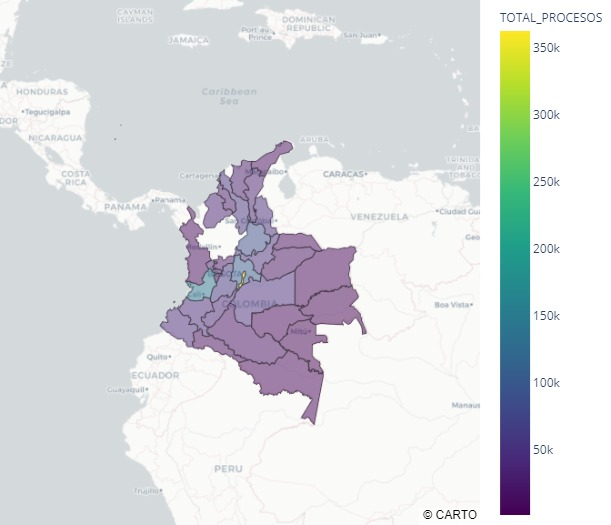

## MARÍA ALEJANDRA BOLIVAS CARDENAS

In [50]:
CONTEO_DE_PROCESOS1 = CONTEO_DE_PROCESOS[CONTEO_DE_PROCESOS.MUNICIPIO.isin(["MEDELLÍN",'IBAGUÉ','VILLAVICENCIO','BUCARAMANGA','CALI','BOGOTÁ, D.C.',
                                           'CÚCUTA','CARTAGENA','PASTO','POPAYÁN','PEREIRA','SANTA MARTA','VALLEDUPAR','NEIVA',
                                            'MONTERÍA','MANIZALES','ARMENIA','SOACHA','BARRANCABERMEJA','PALMIRA','FLORENCIA',
                                            'BELLO','TUNJA','QUIBDO','SINCELEJO','ITAGUI','BUENAVENTURA','YOPAL','RIONEGRO','TULUA'])]

In [51]:
CONTEO_DE_PROCESOS1 = CONTEO_DE_PROCESOS1[CONTEO_DE_PROCESOS1.GRUPO_DELITO.isin(["DELITOS SEXUALES",'EXTORSION','VIOLENCIA INTRAFAMILIAR',
                                                                              'DESAPARICION FORZADA','HURTO','ESTUPEFACIENTES'])]

Para este modismo se utilizaron las variables clasificadas anteriormente, estado de la noticia, municipio, total de procesos, etapa y delito.

#### VISUALIZACIÓN MULTIVARIADA


##### ***¿Qué?, ¿Porqué? y ¿Cómo?***


 #####  ¿Qué?

Se evidencia que el Dataset cuenta con atributos categóricos para casi todas las variables excepto total de procesos. Total de procesos es una variable ordenada cuantitativa y cuenta con una dirección secuencial, el tipo de Data Set utilizado será un gráfico de dispersión que contiene el estado de la noticia la etapa en la que se encuentra el grupo de delito y el total para estos. Son datos estáticos, es decir, que no cambian en el tiempo. 

#####  ¿Porqué? 


En el caso de los verbos utilizados para la descripción de la visualización, se utilizaron el analizar, y compara por medio del gráfico de dispersión cómo se comporta el grupo de delito dependiendo su etapa y estado en el que se encuentre.

En el caso de los sustantivos que se utilizaron para las variables se tienen en cuenta el consumir y presentar, adicionalmente su searh esta referenciado con un lookup, dado que al realizar el modismo la idea que es se vea la comparación entre estos y como están siendo distribuidos.

##### ¿Cómo?



La visualización fue estructurada en forma de gráfico de dispersión, estática que compara las diferentes categorías y etapas, la visualización es alineada, en la cual, se va a contar con dos ejes los cuales son para el eje “X” la variable categórica será la etapa, y en el eje “Y” se colocará la variable cuantitativa total de procesos. Por último, en esta visualización se evidenciará un Dataset de partición y tendrá un filtro en el grupo de delito ya que solo se quiere identificar los delitos más comunes. El color se usará para mostrar el grupo de delito.


### PRIMER MODISMO MULTIVARIADO: MARÍA ALEJANDRA BOLIVAR

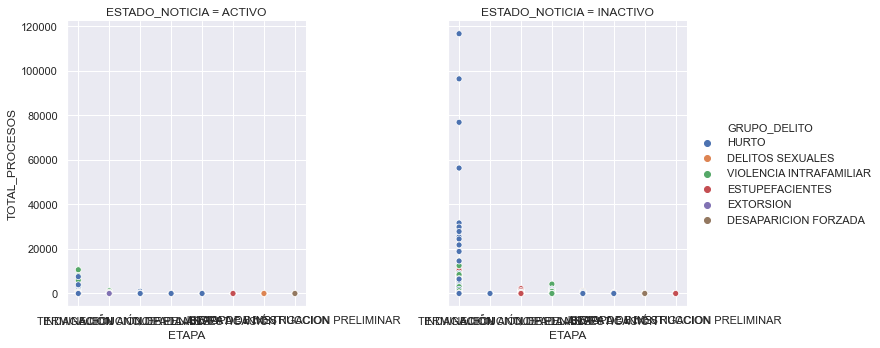

In [52]:
sns.relplot(
    data=CONTEO_DE_PROCESOS1, x="ETAPA", y="TOTAL_PROCESOS",
    col="ESTADO_NOTICIA", hue="GRUPO_DELITO",
    kind="scatter"
)

##### ***Marcas y canales***

•	Los canales utilizados en las visualizaciones serán el color que representa la variable grupo de delito, el cual varía según el delito. El canal de posición espacial vertical para el atributo cuantitativo total de procesos, y el canal de posición espacial horizontal para el atributo categórico etapa. 

•	Las marcas serán los puntos.

##### ***Mejoras posibles, en cuánto a marcas o canales, que le realizaría a la visualización****

En general la visualización me parece buena ya que se ve muy claramente el grupo de delito al que se está refiriendo pudiendo hacer la comparación entre el estado de la noticia, además, se evidencian los datos atípicos que se pueden tener. Le mejoraría en el eje “X” el tema de los nombres ya que se ve un poco apiñuscado y no se puede leer bien. 

Como se puede ver el delito más común es el hurto y  la violencia intrafamiliar tanto para los activos como para los inactivos pero en los inactivos se ve una gran cantidad de procesos, la etapa de indagación es la que más procesos tiene, seguida de la de investigación, para los procesos que están activos otro de los delitos que más se puede evidenciar es el de los sexuales este si se ve más en las diferentes etapas, pero para los procesos inactivos se ve en gran proporción el hurto, la violencia intrafamiliar y la venta de estupefacientes.

La siguiente visualización nos mostrara como este tipo de delitos han aumentado o disminuido a través del tiempo ya que como vimos anteriormente son muchos así estén activos o inactivos. 

### SEGUNDO MODISMO TEMPORAL: MARÍA ALEJANDRA BOLIVAR

##### ***¿Qué?, ¿Porqué? y ¿Cómo?***

#####  ¿Qué?

Se evidencia que el Dataset cuenta con las variables año y total de procesos que son ordenadas cuantitativas y la variable total de procesos cuenta con una dirección secuencial, el tipo de Data Set utilizado será un gráfico de líneas que contiene el año de hecho del proceso y el total que tuvieron en esos. Los datos son datos estáticos, es decir, que no cambian en el tiempo. 

 #####  ¿Poqué?
 
 
 En el caso de los verbos utilizados para la descripción de la visualización, se utilizaron el analizar, y percibir por medio del gráfico de líneas cómo se comporta la variable grupo de delito con respecto a su año de echo. 
En el caso de los sustantivos que se utilizaron para las variables se tienen en cuenta el presentar y descubrir, adicionalmente su searh será el de tendencia, dado que se quiere ver cómo se comporta la variable a través del tiempo y si hay patrones en esta.

 #####  ¿Cómo?
 
 
La visualización fue estructurada en forma de gráfico delineas, estática que identifica los posibles patrones que hay en el tiempo, la visualización es alineada, en la cual, se va a contar con dos ejes los cuales son para el eje “X” la variable año de hecho, y en el eje “Y” se colocará la variable cuantitativa total de procesos donde el tiempo suele ir de izquierda a derecha, además, su escala será el grupo de delito. 

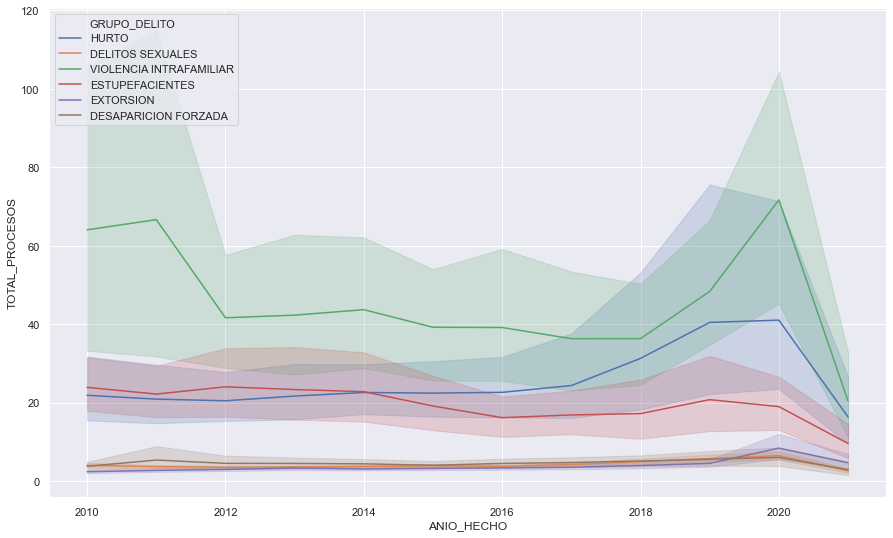

##### ***Marcas y canales***

•	Los canales utilizados en las visualizaciones serán el color. El canal de posición espacial vertical para el atributo cuantitativo total de procesos, y el canal de posición espacial horizontal para el año de hecho. 

•	Las marcas serán las líneas.


##### ***Mejoras posibles, en cuánto a marcas o canales, que le realizaría a la visualización****

En general la visualización me parece muy buena ya que se ve muy claramente como van aumentando o disminuyendo los tipos de delito, además, se evidencian unas tendencias atípicas en algunos años. 


Como se puede evidenciar el delito de violencia intrafamiliar y huerto son los que más han cambiado en el tiempo confirmando lo dicho anteriormente, se ve que entre 2011 y 2012 hubo un descenso no mucho para la violencia intrafamiliar, pero lo hubo luego se mantuvo un volátil hasta 2018, luego empezó a aumentar y se ve que hubo un pico entre 2019 y 2020 posiblemente causado por la pandemia ya que las personas tenían que estar encerradas con sus familias casi que todo el tiempo. EL delito de hurto también tuvo un aumento entre 2019 y 2020 aunque es no se vio tanto como el de la violencia intrafamiliar, la venta de estupefacientes es otro de los que resalta, pero para este caso se ha mantenido lineal, aunque con algunos picos y descensos. Para los otros delitos se puede ver que casi no han cambiado en el tiempo es decir que han sido lineales, pero para 2020 otra vez se alcanza a ver un leve aumento en todos los grupos de delito. 

### TERCER MODISMO ESPACIAL: MARÍA ALEJANDRA BOLIVAR

#### TREEMAP

#####  ¿Qué?

Basados en el Framework de Tamara, evidenciamos que el Dataset cuenta con atributos categóricos para casi todas las variables excepto total de procesos y municipio. Total de procesos son variables ordenadas cuantitativas y cuenta con una dirección secuencial, el tipo de Data Set utilizado será un Treemap que contienen clasificaciones, son datos estáticos, es decir, que no cambian en el tiempo. Tiene 1 atributo cuantitativo en los nodos de las hojas.

 #####  ¿Poqué?
 
 Esta visualización se quiere realizar porque cuenta con los sustantivos y verbos encargados de describir las acciones y objetivos de esta. 
En el caso de los verbos utilizados para la descripción de la visualización, se utilizaron el descubrir, y analizar por medio del Treemaps el análisis básico de las proporciones de los valores que tiene el estado de la noticia y el grupo de delito, además se buscara la segmentación de estos procesos basados en su municipio. 
En el caso de los sustantivos que se utilizaron para las variables se tienen en cuenta la relación y proporción. Adicionalmente, la visualización tiene estructura jerárquica donde les asigna un tamaño y un orden en función de la variable cuantitativa. 

 #####  ¿Cómo?
 
 En el como del Framework de Tamara lo que se quiere es saber de qué manera fue hecha la visualización, fueron estructurados en forma de árbol, por jerarquía, como un conjunto de rectángulos anidados. A cada grupo se le asigna un rectángulo, que después se combina con rectángulos más pequeños que representan subgrupos. El tamaño y el color se usan para mostrar dimensiones numéricas independientes de los datos.

In [54]:
fig = px.treemap(CONTEO_DE_PROCESOS1, path=['ESTADO_NOTICIA','GRUPO_DELITO', 'MUNICIPIO'], 
                 values='TOTAL_PROCESOS', 
                 color='GRUPO_DELITO')
  
fig.show()

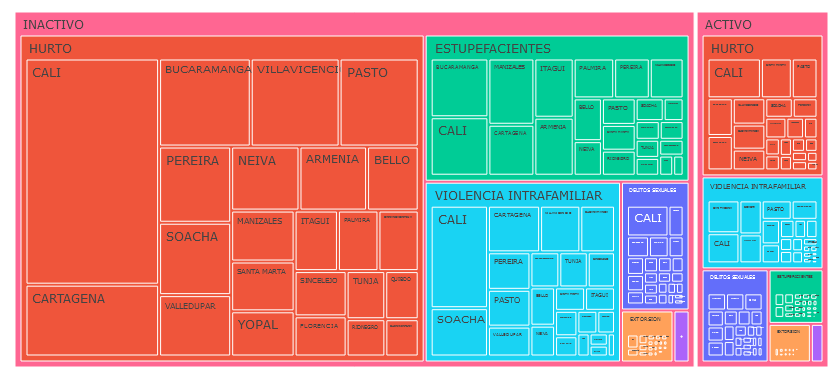

##### ***Marcas y canales***


•	Los canales utilizados en las visualizaciones serán el área, el color, y el tamaño para cada atributo, el color representa la categoría será topológico. 

•	Las marcas serán las figuras y las áreas.


##### ***Mejoras posibles, en cuánto a marcas o canales, que le realizaría a la visualización****

En general la visualización me parece muy buena ya que se ve muy claramente la jerarquía pues cada conjunto de rectángulos del mismo nivel de la jerarquía representa una columna y cada rectángulo individual o más pequeño representa una categoría de una columna. Además, el canal de color es muy bueno para la visualización. 


Siguiendo la línea planteada se evidencia más claramente que el estado que tiene más procesos es el inactivo, pero con esta visualización también podemos ver qué de los grupos de delitos que municipios son los que más contienen procesos y cual predomina más. 
Cali, Cartagena, Bucaramanga, Villavicencio son los municipios que más resaltan para cada grupo de delito, por lo cual se recomendaría hacer un análisis más profundo para saber que sucede en estas partes del país. 


In [55]:
CONTEO_DE_PROCESOS_2020 = CONTEO_DE_PROCESOS[(CONTEO_DE_PROCESOS['ANIO_DENUNCIA'] == 2020)]
CONTEO_DE_PROCESOS_2020.head()

,Unnamed: 0,HECHO,RUPTURA,CONEXO,ESTADO_NOTICIA,ETAPA,ANIO_DENUNCIA,ANIO_ENTRADA,ANIO_HECHO,LEY,PAIS,DEPARTAMENTO,MUNICIPIO,SECCIONAL,GRUPO_DELITO,DELITO,CAPTURA,IMPUTACION,CONDENA,ACUSACION,HOMICIDIO_DOLOSO_CONSUMADO,TOTAL_PROCESOS
1,1,SI,NO,NO,ACTIVO,INDAGACIÓN,2020,2020,2020,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,HURTO,HURTO. ART. 239 C.P. AGRAVADO CUANDO LO HURTAD...,NO,NO,NO,NO,NO,891
2,2,SI,NO,NO,ACTIVO,JUICIO,2020,2020,2020,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,HURTO,HURTO CALIFICADO MENOR CUANTIA ART. 240 C.P. ...,NO,SI,NO,NO,NO,284
16,16,NO,NO,NO,INACTIVO,INDAGACIÓN,2020,2020,2020,Ley 906,Colombia,Sucre,SINCELEJO,DIRECCIÓN SECCIONAL DE SUCRE,VIOLENCIA INTRAFAMILIAR,VIOLENCIA INTRAFAMILIAR ART. 229 C.P.,NO,NO,NO,NO,NO,220
36,36,NO,NO,NO,INACTIVO,QUERELLABLE,2020,2020,2020,Ley 906,Colombia,"BOGOTÁ, D. C.","BOGOTÁ, D.C.",DIRECCIÓN SECCIONAL DE BOGOTÁ,INJURIA Y CALUMNIA,DE LA INJURIA Y LA CALUMNIA,NO,NO,NO,NO,NO,342
49,49,SI,NO,NO,INACTIVO,INDAGACIÓN,2020,2020,2020,Ley 906,Colombia,Santander,BARRANCABERMEJA,DIRECCIÓN SECCIONAL DE MAGDALENA MEDIO,HURTO,HURTO. ART. 239 C.P.,NO,NO,NO,NO,NO,366


In [56]:
CONTEO_DE_PROCESOS_2020 = pd.pivot_table(CONTEO_DE_PROCESOS_2020, 
                                values='TOTAL_PROCESOS', 
                                index=['DEPARTAMENTO'],
                                aggfunc=np.sum)

CONTEO_DE_PROCESOS_2020 = pd.DataFrame(CONTEO_DE_PROCESOS_2020)
CONTEO_DE_PROCESOS_2020.reset_index(inplace=True)
CONTEO_DE_PROCESOS_2020.dtypes
CONTEO_DE_PROCESOS_2020.head()

,DEPARTAMENTO,TOTAL_PROCESOS
0,Amazonas,1361
1,Antioquia,152139
2,Arauca,4812
3,"Archipiélago de San Andrés, Providencia y Sant...",1871
4,Atlántico,46777


In [57]:
Departamentos = pd.read_csv("C:/Users/Gabriela C/Downloads/Conteo_2020.csv", sep = ",", encoding="latin",  decimal=",",
                       dtype={"id": str})

Departamentos.columns = ['id', 'name', 'TOTAL_PROCESOS', 'lat', 'lon','year']
Departamentos.head(-20)

,id,name,TOTAL_PROCESOS,lat,lon,year
0,5,ANTIOQUIA,5113,672.243.395.474.716,-756.245.999.698.988,2020
1,8,ATLÁNTICO,609,10.691.144.654.852.900,-7.498.361.674.542.840,2020
2,11,BOGOTÁ,3788,432.664.941.085.017,-7.418.417.790.176.300,2020
3,13,BOLÍVAR,24188,9.115.397.922.120.680,-7.463.711.074.347.120,2020
4,15,BOYACÁ,68685,56.821.114.029.586.900,-7.331.761.170.310.540,2020
5,17,CALDAS,2090,530.282.380.609.869,-7.542.718.410.440.500,2020
6,18,CAQUETÁ,930,12.906.870.583.376.300,-7.500.692.517.172.860,2020
7,19,CAUCA,15918,25.701.740.846.627.700,-7.674.414.729.664.440,2020
8,20,CESAR,116233,9.312.446.364.924.000,-735.749.157.988.241,2020
9,23,CÓRDOBA,18536,8.754.691.316.868.700,-757.338.775.553.485,2020


In [58]:
from urllib.request import urlopen
import json
with urlopen('https://gist.githubusercontent.com/john-guerra/43c7656821069d00dcbc/raw/be6a6e239cd5b5b803c6e7c2ec405b793a9064dd/Colombia.geo.json') as response:
    departamentos = json.load(response)
print(departamentos["features"][0]["properties"])

{'DPTO': '05', 'NOMBRE_DPT': 'ANTIOQUIA', 'AREA': 63351855546.895, 'PERIMETER': 1963728.843, 'HECTARES': 6335185.555}


#### VISULIAZACIÓN ESPACIAL


La siguiente visualización la geoespacial la cual busca ver que paso con los departamentos para el año 2020 que fue donde en la mayoría de delitos hubo un incremento.

#####  ¿Qué?

Basados en el Framework de Tamara, evidenciamos que el Dataset cuenta un atributo categórico codificado como color sobre los departamentos, el tipo de Data Set utilizado será un mapa coropleto que utiliza geometría geográfica donde son datos estáticos. 

#####  ¿Porque?

En el caso de los verbos utilizados para la descripción de la visualización, se utilizaron el identificar, y localizar por medio del mapa coropleto las distribuciones geométricas y las relaciones entre los datos y su ubicación para el año 2020.  
En el caso de los sustantivos que se utilizaron para las variables se tienen en cuenta la asignación y proporción. Adicionalmente, la visualización tiene estructura espacial que asigna un color al departamento relacionada con la variable cuantitativa.

#####  ¿Comó?

El mapa fue estructurado en forma de mapa geoespacial

In [59]:
import plotly.express as px

fig = px.choropleth_mapbox(Departamentos, geojson=departamentos, 
                           locations='id', 
                           featureidkey = 'properties.DPTO',
                           color='TOTAL_PROCESOS',
                           color_continuous_scale="picnic",
                           mapbox_style="carto-positron",
                           zoom=3, 
                           center = {"lat": 4.570868, "lon": -74.297333},
                           opacity=0.5,
                           labels={'unemp':'ETAPA'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

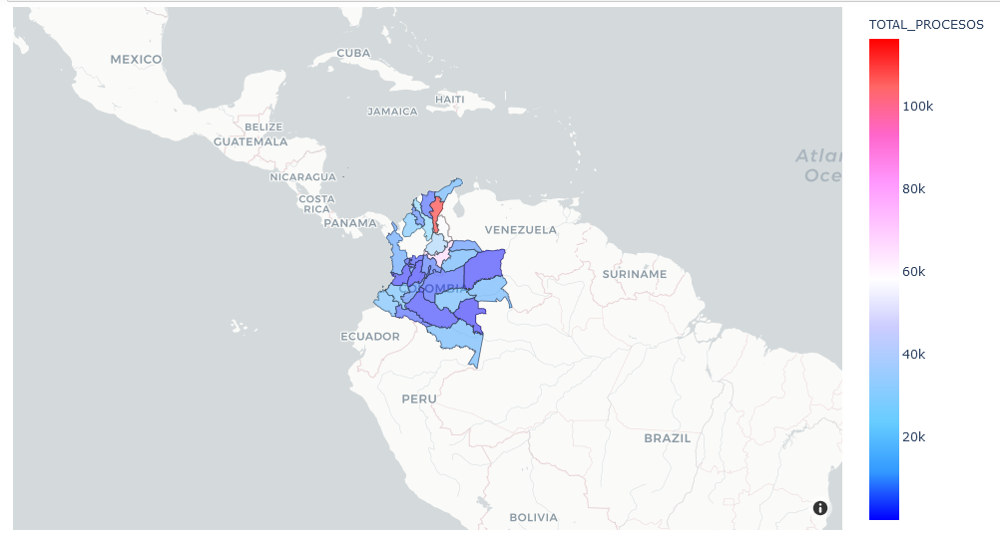

##### ***Marcas y canales***

•	Los canales utilizados en las visualizaciones será el color, segmentado secuencialmente 

•	La marca será de área, donde la forma de cada departamento se determina utilizando una geometría determinada.


##### ***Mejoras posibles, en cuánto a marcas o canales, que le realizaría a la visualización****

En general la visualización me parece muy buena ya que se ve muy claramente en que departamentos hay más procesos para el año 2020, además es canal de color es muy claro para los departamentos delimitados.

Para esta visualización se puede concluir que el departamento con más procesos de delitos para el año 2020 fue el de Cesar seguido de Boyacá, por lo cual sería necesario hacer un análisis más profundo para estos departamentos en ese año.

### GRACIAS

juan.sarmientop@usantotomas.edu.co


mariabolivar@usantotomas.edu.co


gabriela.cortes@usantotomas.edu.co